In [1]:
import numpy as np
import torch
import nibabel as nib 
import nilearn as nil
from nilearn import image
from models import Parellel_Renorm_Dynamic,normalize_3d,scale_calculate
import matplotlib.pyplot as plt
import seaborn as sns
from nilearn import plotting
from nilearn.maskers import NiftiLabelsMasker
import os
from tqdm import tqdm
#The method to import data
from nilearn import datasets
from scipy.stats import sem
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
#Whether to use cuda or not
use_cuda = torch.cuda.is_available()
device = torch.device('cuda:0') if use_cuda else torch.device('cpu')

colors = ['#F4F1DE','#DF7A5E','#3C405B','#82B29A','#F2CC8E']

# Experimental Results

In [2]:
"""
#Load all of these data and draw Visulize plots
#loss_array_NIS=np.load('AOMIC_preprocessed_Results/NIS_schaefer_cut=1.9_hidden=256_parallel_training=800/Losses_kde.npy')
#EIs_array_NIS=np.load('AOMIC_preprocessed_Results/NIS_schaefer_cut=1.9_hidden=256_parallel_training=800/EIs_kde.npy')
CEs_array_NIS=np.load('AOMIC_preprocessed_Results/system/NIS_schaefer_cut=1.9_hidden=256_parallel_training=800/CEs_kde.npy')
#Load all of these data and draw Visulize plots
CEs_array_NIS_plus1=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=1_training=800/CEs_kde.npy')
CEs_array_NIS_plus3=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=3_training=800/CEs_kde.npy')
CEs_array_NIS_plus7=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=7_training=800/CEs_kde.npy')
CEs_array_NIS_plus14=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=14_training=800/CEs_kde.npy')
CEs_array_NIS_plus27=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=27_training=800/CEs_kde.npy')
CEs_array_NIS_plus52=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=52_training=800/CEs_kde.npy')
"""


"\n#Load all of these data and draw Visulize plots\n#loss_array_NIS=np.load('AOMIC_preprocessed_Results/NIS_schaefer_cut=1.9_hidden=256_parallel_training=800/Losses_kde.npy')\n#EIs_array_NIS=np.load('AOMIC_preprocessed_Results/NIS_schaefer_cut=1.9_hidden=256_parallel_training=800/EIs_kde.npy')\nCEs_array_NIS=np.load('AOMIC_preprocessed_Results/system/NIS_schaefer_cut=1.9_hidden=256_parallel_training=800/CEs_kde.npy')\n#Load all of these data and draw Visulize plots\nCEs_array_NIS_plus1=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=1_training=800/CEs_kde.npy')\nCEs_array_NIS_plus3=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=3_training=800/CEs_kde.npy')\nCEs_array_NIS_plus7=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=7_training=800/CEs_kde.npy')\nCEs_array_NIS_plus14=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=14_training=800/CEs_kde.npy')\

In [2]:
#Load all of these data and draw Visulize plots
CEs_array_NIS=np.load('AOMIC_preprocessed_Results/system/NIS_schaefer_cut=1.9_hidden=256_parallel_training=800/CEs_kde.npy')
#Load all of these data and draw Visulize plots
EIs_array_NIS_plus1=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=1_training=800/EIs_kde.npy')
EIs_array_NIS_plus3=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=3_training=800/EIs_kde.npy')
EIs_array_NIS_plus7=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=7_training=800/EIs_kde.npy')
EIs_array_NIS_plus14=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=14_training=800/EIs_kde.npy')
EIs_array_NIS_plus27=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=27_training=800/EIs_kde.npy')
EIs_array_NIS_plus52=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=52_training=800/EIs_kde.npy')
EIs_array_NIS_plus100=np.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=100_training=800/EIs_kde.npy')

In [3]:
CEs_array_NIS_plus1=EIs_array_NIS_plus1-EIs_array_NIS_plus100[:,0][:,np.newaxis]
CEs_array_NIS_plus3=EIs_array_NIS_plus3-EIs_array_NIS_plus100[:,0][:,np.newaxis]
CEs_array_NIS_plus7=EIs_array_NIS_plus7-EIs_array_NIS_plus100[:,0][:,np.newaxis]
CEs_array_NIS_plus14=EIs_array_NIS_plus14-EIs_array_NIS_plus100[:,0][:,np.newaxis]
CEs_array_NIS_plus27=EIs_array_NIS_plus27-EIs_array_NIS_plus100[:,0][:,np.newaxis]
CEs_array_NIS_plus52=EIs_array_NIS_plus52-EIs_array_NIS_plus100[:,0][:,np.newaxis]

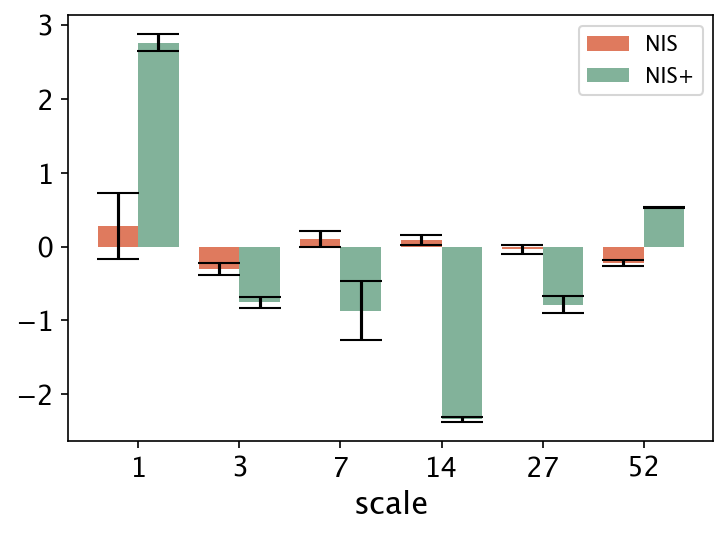

In [4]:
#scale=['52','27','14','7','3','1']
scale=['1','3','7','14','27','52']
CE_mean_NIS=CEs_array_NIS[-20:,1:].mean(0)
CE_std_NIS=CEs_array_NIS[-20:,1:].std(0)
CE_mean_NIS_plus1=CEs_array_NIS_plus1[-10:,1:].mean(0)
CE_std_NIS_plus1=CEs_array_NIS_plus1[-10:,1:].std(0)
CE_mean_NIS_plus3=CEs_array_NIS_plus3[-10:,1:].mean(0)
CE_std_NIS_plus3=CEs_array_NIS_plus3[-10:,1:].std(0)
CE_mean_NIS_plus7=CEs_array_NIS_plus7[-10:,1:].mean(0)
CE_std_NIS_plus7=CEs_array_NIS_plus7[-10:,1:].std(0)
CE_mean_NIS_plus14=CEs_array_NIS_plus14[-10:,1:].mean(0)
CE_std_NIS_plus14=CEs_array_NIS_plus14[-10:,1:].std(0)
CE_mean_NIS_plus27=CEs_array_NIS_plus27[-10:,1:].mean(0)
CE_std_NIS_plus27=CEs_array_NIS_plus27[-10:,1:].std(0)
CE_mean_NIS_plus52=CEs_array_NIS_plus52[-10:,1:].mean(0)
CE_std_NIS_plus52=CEs_array_NIS_plus52[-10:,1:].std(0)

# 创建柱状图
fig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150)

# 设置柱状图的位置和宽度
bar_positions = np.arange(6)
bar_width = 0.4

# 使用seaborn库的color_palette函数设置配色
#colors = sns.color_palette('pastel', n_colors=2)

# 画柱状图，将颜色参数设置为colors
bars = ax.bar(bar_positions-0.2, CE_mean_NIS[::-1], width=bar_width, color=colors[1], yerr=CE_std_NIS[::-1], capsize=10)
bars = ax.bar(bar_positions[0]+0.2, CE_mean_NIS_plus1[-1], width=bar_width, color=colors[3], yerr=CE_std_NIS_plus1[-1],capsize=10)
bars = ax.bar(bar_positions[1]+0.2, CE_mean_NIS_plus3[-2], width=bar_width, color=colors[3], yerr=CE_std_NIS_plus3[-2],capsize=10)
bars = ax.bar(bar_positions[2]+0.2, CE_mean_NIS_plus7[-3], width=bar_width, color=colors[3], yerr=CE_std_NIS_plus7[-3],capsize=10)
bars = ax.bar(bar_positions[-3]+0.2, CE_mean_NIS_plus27[2], width=bar_width, color=colors[3], yerr=CE_std_NIS_plus27[2],capsize=10)
bars = ax.bar(bar_positions[-2]+0.2, CE_mean_NIS_plus27[1], width=bar_width, color=colors[3], yerr=CE_std_NIS_plus27[1],capsize=10)
bars = ax.bar(bar_positions[-1]+0.2, CE_mean_NIS_plus52[0], width=bar_width, color=colors[3], yerr=CE_std_NIS_plus52[0],capsize=10)

# 添加坐标轴标签
#ax.set_xlabel('scale',size=14)
#ax.set_ylabel(r'$\mathcal{J}$',size=14)

# 添加刻度标签
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)

ax.set_xticks(bar_positions)
ax.set_xticklabels(scale)

plt.legend(['NIS','NIS+'])
plt.xlabel('scale',fontsize=15)
#plt.ylabel(r'$\Delta\mathcal{J}$', fontsize=15)

# 显示图形
plt.show()

# Validation Loss

In [16]:
#Lode the data and the model
torch.cuda.empty_cache()
data=np.load('Preprocessed_files/AOMIC_preprocessed_schaefer_100.npy',allow_pickle=True)
#data=np.load('Preprocessed_files/AOMIC_PIOP1_schaefer.npy',allow_pickle=True)
data=normalize_3d(data)
data=torch.tensor(data,device=device).to(torch.float32)
#Make a net
net = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
#Load the net parameters
#net.load_state_dict(torch.load('data/AOMIC_resample_aal_model76000.pkl',map_location=device))
#net.load_state_dict(torch.load('AOMIC_resample_Results/NIS+_aal_cut=2_hidden=256_nonparallel/AOMIC_resample_aal_model_kde56000.pkl',map_location=device))
#net.load_state_dict(torch.load('AOMIC_preprocessed_Results/NIS+_schaefer_cut=1.9_hidden=256_layer=1_training=800_normalize=False/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#net.load_state_dict(torch.load('AOMIC_preprocessed_Results/NIS_schaefer_cut=1.9_hidden=256_parallel_training=800/AOMIC_preprocessed_schaefer_100_model50000.pkl',map_location=torch.device('cpu')))
net.load_state_dict(torch.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=1_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#net.load_state_dict(torch.load('AOMIC_preprocessed_Results/resting/NIS+_schaefer_cut=1.9_hidden=256_layer=1/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))

<All keys matched successfully>

In [9]:
macro_data_1=np.zeros([data.shape[0]*data.shape[1],1])
macro_data_3=np.zeros([data.shape[0]*data.shape[1],3])
macro_data_7=np.zeros([data.shape[0]*data.shape[1],7])
macro_data_14=np.zeros([data.shape[0]*data.shape[1],14])
macro_data_27=np.zeros([data.shape[0]*data.shape[1],27])
macro_data_52=np.zeros([data.shape[0]*data.shape[1],52])
for i in tqdm(range(data.shape[0])):
    sample_data=data[i,:,:]
    macro_data_1[i*data.shape[1]:(i+1)*data.shape[1],:]=net(sample_data)[1][-1][:,:].detach().numpy()
    macro_data_3[i*data.shape[1]:(i+1)*data.shape[1],:]=net(sample_data)[1][-2][:,:].detach().numpy()
    macro_data_7[i*data.shape[1]:(i+1)*data.shape[1],:]=net(sample_data)[1][-3][:,:].detach().numpy()
    macro_data_14[i*data.shape[1]:(i+1)*data.shape[1],:]=net(sample_data)[1][-4][:,:].detach().numpy()
    macro_data_27[i*data.shape[1]:(i+1)*data.shape[1],:]=net(sample_data)[1][-5][:,:].detach().numpy()
    macro_data_52[i*data.shape[1]:(i+1)*data.shape[1],:]=net(sample_data)[1][-6][:,:].detach().numpy()
    
micro_data=data.reshape(-1,data.shape[2])

np.savetxt('ReconcilingEmergences/testdata/macro_data_1.csv',macro_data_1)
np.savetxt('ReconcilingEmergences/testdata/macro_data_3.csv',macro_data_3)
np.savetxt('ReconcilingEmergences/testdata/macro_data_7.csv',macro_data_7)
np.savetxt('ReconcilingEmergences/testdata/macro_data_14.csv',macro_data_14)
np.savetxt('ReconcilingEmergences/testdata/macro_data_27.csv',macro_data_27)
np.savetxt('ReconcilingEmergences/testdata/macro_data_52.csv',macro_data_52)
np.savetxt('ReconcilingEmergences/testdata/micro_data.csv',micro_data)
'''
macro_data_1=np.zeros([data.shape[1],data.shape[0]*1])
macro_data_3=np.zeros([data.shape[1],data.shape[0]*3])
macro_data_7=np.zeros([data.shape[1],data.shape[0]*7])
macro_data_14=np.zeros([data.shape[1],data.shape[0]*14])
macro_data_27=np.zeros([data.shape[1],data.shape[0]*27])
macro_data_52=np.zeros([data.shape[1],data.shape[0]*52])
for i in tqdm(range(data.shape[0]-1)):
    sample_data=data[i,:,:]
    macro_data_1[:,i*1:(i+1)*1]=net(sample_data)[1][-1][:,:].detach().numpy()
    macro_data_3[:,i*3:(i+1)*3]=net(sample_data)[1][-2][:,:].detach().numpy()
    macro_data_7[:,i*7:(i+1)*7]=net(sample_data)[1][-3][:,:].detach().numpy()
    macro_data_14[:,i*14:(i+1)*14]=net(sample_data)[1][-4][:,:].detach().numpy()
    macro_data_27[:,i*27:(i+1)*27]=net(sample_data)[1][-5][:,:].detach().numpy()
    macro_data_52[:,i*52:(i+1)*52]=net(sample_data)[1][-6][:,:].detach().numpy()
    
micro_data=torch.swapaxes(data,0,1).reshape(data.shape[1],-1)

np.savetxt('ReconcilingEmergences/testdata/macro_data_1.csv',macro_data_1)
np.savetxt('ReconcilingEmergences/testdata/macro_data_3.csv',macro_data_3)
np.savetxt('ReconcilingEmergences/testdata/macro_data_7.csv',macro_data_7)
np.savetxt('ReconcilingEmergences/testdata/macro_data_14.csv',macro_data_14)
np.savetxt('ReconcilingEmergences/testdata/macro_data_27.csv',macro_data_27)
np.savetxt('ReconcilingEmergences/testdata/macro_data_52.csv',macro_data_52)
np.savetxt('ReconcilingEmergences/testdata/micro_data.csv',micro_data)
'''

  0%|          | 1/830 [00:06<1:27:20,  6.32s/it]


KeyboardInterrupt: 

In [8]:
#`plt.cm.gist_rainbow`
'''
fig, axs = plt.subplots(20,figsize=(5,4),dpi=150)
cmap=plt.get_cmap('Set1')
colors=cmap(np.linspace(0,1,20))
for i in range(20):
    axs[i].plot(data[0,:,i],c=colors[i])
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    axs[i].set_frame_on(False)
'''

"\nfig, axs = plt.subplots(20,figsize=(5,4),dpi=150)\ncmap=plt.get_cmap('Set1')\ncolors=cmap(np.linspace(0,1,20))\nfor i in range(20):\n    axs[i].plot(data[0,:,i],c=colors[i])\n    axs[i].set_xticks([])\n    axs[i].set_yticks([])\n    axs[i].set_frame_on(False)\n"

In [3]:
#define a predict function
def multi_step_predict(initial,model,steps):
    #initialize the predict data
    predict=torch.zeros([7,100,steps])
    #start the preidction
    state=torch.ones([7,100])*initial
    #loop through different dimensions
    for i in range(7):
        #loop through different steps
        for j in range(steps):
            predicts,latents,lantents_p=model(state[i])
            predict[i,:,j]=predicts[i]
            state[i]=predict[i,:,j]
    #Then we finally return what we want to do 
    return predict

In [4]:
data.shape

torch.Size([830, 290, 100])

In [5]:
#Then we can use the loaded data for predict
#Pick any person,any region
steps=10
initial_time=np.random.choice(290-steps-1,30,replace=False)

In [11]:
'''
predict_collection=[]
for subject in tqdm(range(30)):
    data_sample=data[-subject-1,initial_time[subject]:initial_time[subject]+1,:]
    predict=multi_step_predict(data_sample,net,steps)
    predict_collection.append(predict)
    
prediction_collection=[predict_collection[i].detach().numpy() for i in range(30)]
prediction_collection=np.array(prediction_collection)
#Know the real data
real=[]
for subject in range(30):
    real.append(data[-subject-1,initial_time[subject]+1:initial_time[subject]+steps+1,:].detach().numpy().T)
real=np.array(real)
error=prediction_collection-real[:,np.newaxis,:,:]

error_collection_100=np.abs(error[:,0,:,:])
error_collection_52=np.abs(error[:,1,:,:])
error_collection_27=np.abs(error[:,2,:,:])
error_collection_14=np.abs(error[:,3,:,:])
error_collection_7=np.abs(error[:,4,:,:])
error_collection_3=np.abs(error[:,5,:,:])
error_collection_1=np.abs(error[:,6,:,:])

#
mean_100=np.mean(error_collection_100,(0,1))
upper_bound_100=mean_100+np.std(error_collection_100,(0,1))
lower_bound_100=mean_100-np.std(error_collection_100,(0,1))
#
mean_52=np.mean(error_collection_52,(0,1))
upper_bound_52=mean_52+np.std(error_collection_52,(0,1))
lower_bound_52=mean_52-np.std(error_collection_52,(0,1))
#
mean_27=np.mean(error_collection_27,(0,1))
upper_bound_27=mean_27+np.std(error_collection_27,(0,1))
lower_bound_27=mean_27-np.std(error_collection_27,(0,1))
#
mean_14=np.mean(error_collection_14,(0,1))
upper_bound_14=mean_14+np.std(error_collection_14,(0,1))
lower_bound_14=mean_14-np.std(error_collection_14,(0,1))
#
mean_7=np.mean(error_collection_7,(0,1))
upper_bound_7=mean_7+np.std(error_collection_7,(0,1))
lower_bound_7=mean_7-np.std(error_collection_7,(0,1))
#
mean_3=np.mean(error_collection_3,(0,1))
upper_bound_3=mean_3+np.std(error_collection_3,(0,1))
lower_bound_3=mean_3-np.std(error_collection_3,(0,1))
#
mean_1=np.mean(error_collection_1,(0,1))
upper_bound_1=mean_1+np.std(error_collection_1,(0,1))
lower_bound_1=mean_1-np.std(error_collection_1,(0,1))

# Create a figure and axis object
fig, ax = plt.subplots()

# Plot the data
ax.plot(mean_100,c='red')
ax.plot(mean_52,c='blue')
ax.plot(mean_27,c='green')
ax.plot(mean_14,c='orange')
ax.plot(mean_7,c='purple')
ax.plot(mean_3,c='brown')
ax.plot(mean_1,c='pink')

ax.fill_between(range(len(mean_29)), lower_bound_117, upper_bound_117, alpha=0.1,color='red')
ax.fill_between(range(len(mean_29)), lower_bound_29, upper_bound_29, alpha=0.1,color='blue')
ax.fill_between(range(len(mean_29)), lower_bound_29, upper_bound_29, alpha=0.1,color='green')
ax.fill_between(range(len(mean_29)), lower_bound_14, upper_bound_14, alpha=0.1,color='orange')
ax.fill_between(range(len(mean_29)), lower_bound_7, upper_bound_7, alpha=0.1,color='purple')
ax.fill_between(range(len(mean_29)), lower_bound_3, upper_bound_3, alpha=0.1,color='brown')
ax.fill_between(range(len(mean_29)), lower_bound_1, upper_bound_1, alpha=0.1,color='gray')
ax.fill_between(range(len(mean_29)), lower_bound_1, upper_bound_1, alpha=0.1,color='pink')


plt.legend(['error_100','error_52','error_27','error 14',
            'error_7','error_3','error 1'],loc='upper left')
plt.show()
'''

"\npredict_collection=[]\nfor subject in tqdm(range(30)):\n    data_sample=data[-subject-1,initial_time[subject]:initial_time[subject]+1,:]\n    predict=multi_step_predict(data_sample,net,steps)\n    predict_collection.append(predict)\n    \nprediction_collection=[predict_collection[i].detach().numpy() for i in range(30)]\nprediction_collection=np.array(prediction_collection)\n#Know the real data\nreal=[]\nfor subject in range(30):\n    real.append(data[-subject-1,initial_time[subject]+1:initial_time[subject]+steps+1,:].detach().numpy().T)\nreal=np.array(real)\nerror=prediction_collection-real[:,np.newaxis,:,:]\n\nerror_collection_100=np.abs(error[:,0,:,:])\nerror_collection_52=np.abs(error[:,1,:,:])\nerror_collection_27=np.abs(error[:,2,:,:])\nerror_collection_14=np.abs(error[:,3,:,:])\nerror_collection_7=np.abs(error[:,4,:,:])\nerror_collection_3=np.abs(error[:,5,:,:])\nerror_collection_1=np.abs(error[:,6,:,:])\n\n#\nmean_100=np.mean(error_collection_100,(0,1))\nupper_bound_100=mean_

In [6]:
#
net1 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net1.load_state_dict(torch.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=1_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#
net3 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net3.load_state_dict(torch.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=3_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#
net7 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net7.load_state_dict(torch.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=7_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#
net14 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net14.load_state_dict(torch.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=14_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#
net27 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net27.load_state_dict(torch.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=27_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#
net52 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net52.load_state_dict(torch.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=52_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))

<All keys matched successfully>

In [248]:
#
'''
net1 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net1.load_state_dict(torch.load('AOMIC_preprocessed_Results/system//NIS+_schaefer_cut=1.9_hidden=256_layer=1_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#
net3 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net3.load_state_dict(torch.load('AOMIC_preprocessed_Results/system//NIS+_schaefer_cut=1.9_hidden=256_layer=3_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#
net7 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net7.load_state_dict(torch.load('AOMIC_preprocessed_Results/system//NIS+_schaefer_cut=1.9_hidden=256_layer=7_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#
net14 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net14.load_state_dict(torch.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=14_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#
net27 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net27.load_state_dict(torch.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=27_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#
net52 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net52.load_state_dict(torch.load('AOMIC_preprocessed_Results/system/NIS+_schaefer_cut=1.9_hidden=256_layer=52_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
'''

"\nnet1 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],\n                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)\nnet1.load_state_dict(torch.load('AOMIC_preprocessed_Results/system//NIS+_schaefer_cut=1.9_hidden=256_layer=1_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))\n#\nnet3 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],\n                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)\nnet3.load_state_dict(torch.load('AOMIC_preprocessed_Results/system//NIS+_schaefer_cut=1.9_hidden=256_layer=3_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))\n#\nnet7 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],\n                         cut_size=1.9, hidden_units = 256, no

In [13]:
'''
macro_data_1=np.zeros([data.shape[0]*data.shape[1],1])
macro_data_3=np.zeros([data.shape[0]*data.shape[1],3])
macro_data_7=np.zeros([data.shape[0]*data.shape[1],7])
macro_data_14=np.zeros([data.shape[0]*data.shape[1],14])
macro_data_27=np.zeros([data.shape[0]*data.shape[1],27])
macro_data_52=np.zeros([data.shape[0]*data.shape[1],52])
for i in tqdm(range(data.shape[0])):
    sample_data=data[i,:,:]
    macro_data_1[i*data.shape[1]:(i+1)*data.shape[1],:]=net1(sample_data)[1][-1][:,:].detach().numpy()
    macro_data_3[i*data.shape[1]:(i+1)*data.shape[1],:]=net3(sample_data)[1][-2][:,:].detach().numpy()
    macro_data_7[i*data.shape[1]:(i+1)*data.shape[1],:]=net7(sample_data)[1][-3][:,:].detach().numpy()
    macro_data_14[i*data.shape[1]:(i+1)*data.shape[1],:]=net14(sample_data)[1][-4][:,:].detach().numpy()
    macro_data_27[i*data.shape[1]:(i+1)*data.shape[1],:]=net27(sample_data)[1][-5][:,:].detach().numpy()
    macro_data_52[i*data.shape[1]:(i+1)*data.shape[1],:]=net52(sample_data)[1][-6][:,:].detach().numpy()
    
micro_data=data.reshape(-1,data.shape[2])

np.savetxt('ReconcilingEmergences/testdata/macro_data_1.csv',macro_data_1)
np.savetxt('ReconcilingEmergences/testdata/macro_data_3.csv',macro_data_3)
np.savetxt('ReconcilingEmergences/testdata/macro_data_7.csv',macro_data_7)
np.savetxt('ReconcilingEmergences/testdata/macro_data_14.csv',macro_data_14)
np.savetxt('ReconcilingEmergences/testdata/macro_data_27.csv',macro_data_27)
np.savetxt('ReconcilingEmergences/testdata/macro_data_52.csv',macro_data_52)
np.savetxt('ReconcilingEmergences/testdata/micro_data.csv',micro_data)


macro_data_1=np.zeros([data.shape[1],data.shape[0]*1])
macro_data_3=np.zeros([data.shape[1],data.shape[0]*3])
macro_data_7=np.zeros([data.shape[1],data.shape[0]*7])
macro_data_14=np.zeros([data.shape[1],data.shape[0]*14])
macro_data_27=np.zeros([data.shape[1],data.shape[0]*27])
macro_data_52=np.zeros([data.shape[1],data.shape[0]*52])
for i in tqdm(range(data.shape[0]-1)):
    sample_data=data[i,:,:]
    macro_data_1[:,i*1:(i+1)*1]=net(sample_data)[1][-1][:,:].detach().numpy()
    macro_data_3[:,i*3:(i+1)*3]=net(sample_data)[1][-2][:,:].detach().numpy()
    macro_data_7[:,i*7:(i+1)*7]=net(sample_data)[1][-3][:,:].detach().numpy()
    macro_data_14[:,i*14:(i+1)*14]=net(sample_data)[1][-4][:,:].detach().numpy()
    macro_data_27[:,i*27:(i+1)*27]=net(sample_data)[1][-5][:,:].detach().numpy()
    macro_data_52[:,i*52:(i+1)*52]=net(sample_data)[1][-6][:,:].detach().numpy()
    
micro_data=torch.swapaxes(data,0,1).reshape(data.shape[1],-1)


np.savetxt('ReconcilingEmergences/testdata/macro_data_1.csv',macro_data_1)
np.savetxt('ReconcilingEmergences/testdata/macro_data_3.csv',macro_data_3)
np.savetxt('ReconcilingEmergences/testdata/macro_data_7.csv',macro_data_7)
np.savetxt('ReconcilingEmergences/testdata/macro_data_14.csv',macro_data_14)
np.savetxt('ReconcilingEmergences/testdata/macro_data_27.csv',macro_data_27)
np.savetxt('ReconcilingEmergences/testdata/macro_data_52.csv',macro_data_52)
np.savetxt('ReconcilingEmergences/testdata/micro_data.csv',micro_data)
'''

"\nmacro_data_1=np.zeros([data.shape[0]*data.shape[1],1])\nmacro_data_3=np.zeros([data.shape[0]*data.shape[1],3])\nmacro_data_7=np.zeros([data.shape[0]*data.shape[1],7])\nmacro_data_14=np.zeros([data.shape[0]*data.shape[1],14])\nmacro_data_27=np.zeros([data.shape[0]*data.shape[1],27])\nmacro_data_52=np.zeros([data.shape[0]*data.shape[1],52])\nfor i in tqdm(range(data.shape[0])):\n    sample_data=data[i,:,:]\n    macro_data_1[i*data.shape[1]:(i+1)*data.shape[1],:]=net1(sample_data)[1][-1][:,:].detach().numpy()\n    macro_data_3[i*data.shape[1]:(i+1)*data.shape[1],:]=net3(sample_data)[1][-2][:,:].detach().numpy()\n    macro_data_7[i*data.shape[1]:(i+1)*data.shape[1],:]=net7(sample_data)[1][-3][:,:].detach().numpy()\n    macro_data_14[i*data.shape[1]:(i+1)*data.shape[1],:]=net14(sample_data)[1][-4][:,:].detach().numpy()\n    macro_data_27[i*data.shape[1]:(i+1)*data.shape[1],:]=net27(sample_data)[1][-5][:,:].detach().numpy()\n    macro_data_52[i*data.shape[1]:(i+1)*data.shape[1],:]=net52(s

In [14]:
'''
#
sample_data=data.mean(0)
macro_data_1=net(sample_data)[1][-1][:,:].detach().numpy()
macro_data_3=net(sample_data)[1][-2][:,:].detach().numpy()
macro_data_7=net(sample_data)[1][-3][:,:].detach().numpy()
macro_data_14=net(sample_data)[1][-4][:,:].detach().numpy()
macro_data_27=net(sample_data)[1][-5][:,:].detach().numpy()
macro_data_52=net(sample_data)[1][-6][:,:].detach().numpy()

micro_data=sample_data.detach().numpy()

np.savetxt('ReconcilingEmergences/testdata/mean_macro_data_1.csv',macro_data_1)
np.savetxt('ReconcilingEmergences/testdata/mean_macro_data_3.csv',macro_data_3)
np.savetxt('ReconcilingEmergences/testdata/mean_macro_data_7.csv',macro_data_7)
np.savetxt('ReconcilingEmergences/testdata/mean_macro_data_14.csv',macro_data_14)
np.savetxt('ReconcilingEmergences/testdata/mean_macro_data_27.csv',macro_data_27)
np.savetxt('ReconcilingEmergences/testdata/mean_macro_data_52.csv',macro_data_52)
np.savetxt('ReconcilingEmergences/testdata/mean_micro_data.csv',micro_data)
'''

"\n#\nsample_data=data.mean(0)\nmacro_data_1=net(sample_data)[1][-1][:,:].detach().numpy()\nmacro_data_3=net(sample_data)[1][-2][:,:].detach().numpy()\nmacro_data_7=net(sample_data)[1][-3][:,:].detach().numpy()\nmacro_data_14=net(sample_data)[1][-4][:,:].detach().numpy()\nmacro_data_27=net(sample_data)[1][-5][:,:].detach().numpy()\nmacro_data_52=net(sample_data)[1][-6][:,:].detach().numpy()\n\nmicro_data=sample_data.detach().numpy()\n\nnp.savetxt('ReconcilingEmergences/testdata/mean_macro_data_1.csv',macro_data_1)\nnp.savetxt('ReconcilingEmergences/testdata/mean_macro_data_3.csv',macro_data_3)\nnp.savetxt('ReconcilingEmergences/testdata/mean_macro_data_7.csv',macro_data_7)\nnp.savetxt('ReconcilingEmergences/testdata/mean_macro_data_14.csv',macro_data_14)\nnp.savetxt('ReconcilingEmergences/testdata/mean_macro_data_27.csv',macro_data_27)\nnp.savetxt('ReconcilingEmergences/testdata/mean_macro_data_52.csv',macro_data_52)\nnp.savetxt('ReconcilingEmergences/testdata/mean_micro_data.csv',micr

In [7]:
def errors(model,level):
    predict_collection=[]
    for subject in tqdm(range(30)):
        data_sample=data[-subject-1,initial_time[subject]:initial_time[subject]+1,:]
        predict=multi_step_predict(data_sample,model,steps)
        predict_collection.append(predict)
        
    prediction_collection=[predict_collection[i].detach().numpy() for i in range(30)]
    prediction_collection=np.array(prediction_collection)
    #Know the real data
    real=[]
    for subject in range(30):
        real.append(data[-subject-1,initial_time[subject]+1:initial_time[subject]+steps+1,:].detach().numpy().T)
    real=np.array(real)
    error=prediction_collection-real[:,np.newaxis,:,:]
    
    prediction_collection=prediction_collection[:,level,:,:]
    error_collection=np.abs(error[:,level,:,:])
    return real,prediction_collection,error_collection

In [8]:
real,prediction_collection_1,error_collection_1=errors(net1,6)
real,prediction_collection_3,error_collection_3=errors(net3,5)
real,prediction_collection_7,error_collection_7=errors(net7,4)
real,prediction_collection_14,error_collection_14=errors(net14,3)
real,prediction_collection_27,error_collection_27=errors(net27,2)
real,prediction_collection_52,error_collection_52=errors(net52,1)

100%|██████████| 30/30 [04:21<00:00,  8.71s/it]


In [19]:
errors=np.mean((error_collection_1+error_collection_3
               +error_collection_7+error_collection_14
               +error_collection_27+error_collection_52)/6,(0,1))

'''
std=np.std([np.mean(error_collection_1,(0,1)),
            np.mean(error_collection_3,(0,1)),
            np.mean(error_collection_7,(0,1)),
            np.mean(error_collection_14,(0,1)),
            np.mean(error_collection_27,(0,1)),
            np.mean(error_collection_52,(0,1))],0)
'''

std=np.std((error_collection_1+error_collection_3
               +error_collection_7+error_collection_14
               +error_collection_27+error_collection_52)/6,(0,1))


In [18]:
'''
#scale=['1','2','3','4','5','6','7','8','9','10']
scale=np.arange(1,steps+1)

# 创建柱状图
fig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150)

# 设置柱状图的位置和宽度
bar_positions = np.arange(steps)
bar_width = 0.5

# 使用seaborn库的color_palette函数设置配色
#colors = sns.color_palette('pastel', n_colors=2)

# 画柱状图，将颜色参数设置为colors
#bars = ax.errorbar(bar_positions,errors,color=colors[2], yerr=std, capsize=5)
ax.plot(errors,marker='o',c=colors[2])
ax.fill_between(range(len(errors)), errors-std, errors+std, alpha=0.1,color=colors[2])
# 添加坐标轴标签
#ax.set_xlabel('scale',size=14)
#ax.set_ylabel(r'$\mathcal{J}$',size=14)

# 添加刻度标签
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)

ax.set_xticks(bar_positions)
ax.set_xticklabels(scale)

#plt.legend(['NIS','NIS+'])
plt.xlabel('steps',fontsize=15)
plt.ylabel('prediction errors',fontsize=15)
#plt.ylabel(r'$\Delta\mathcal{J}$', fontsize=15)

# 显示图形
plt.show()
'''

"\n#scale=['1','2','3','4','5','6','7','8','9','10']\nscale=np.arange(1,steps+1)\n\n# 创建柱状图\nfig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150)\n\n# 设置柱状图的位置和宽度\nbar_positions = np.arange(steps)\nbar_width = 0.5\n\n# 使用seaborn库的color_palette函数设置配色\n#colors = sns.color_palette('pastel', n_colors=2)\n\n# 画柱状图，将颜色参数设置为colors\n#bars = ax.errorbar(bar_positions,errors,color=colors[2], yerr=std, capsize=5)\nax.plot(errors,marker='o',c=colors[2])\nax.fill_between(range(len(errors)), errors-std, errors+std, alpha=0.1,color=colors[2])\n# 添加坐标轴标签\n#ax.set_xlabel('scale',size=14)\n#ax.set_ylabel(r'$\\mathcal{J}$',size=14)\n\n# 添加刻度标签\nplt.tick_params(labelsize=13)\nplt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,\n                    wspace=0.25, hspace=0.2)\n\nax.set_xticks(bar_positions)\nax.set_xticklabels(scale)\n\n#plt.legend(['NIS','NIS+'])\nplt.xlabel('steps',fontsize=15)\nplt.ylabel('prediction errors',fontsize=15)\n#plt.ylabel(r'$\\Delta\\mathcal{J}$', fontsize=15)\n\n

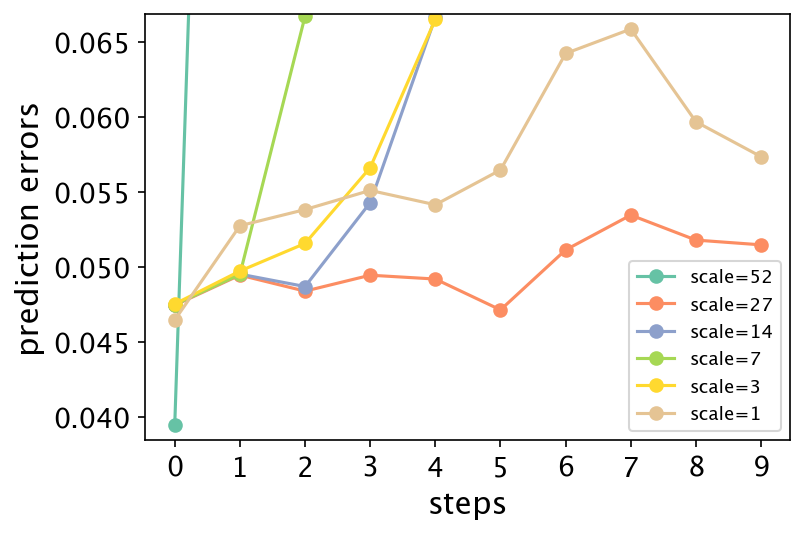

In [99]:
#
cmap=plt.get_cmap('Set2')
colors=cmap(np.linspace(0,1,7))
bar_positions = np.arange(steps)
scale=np.arange(1,steps+1)
#
mean_52=np.mean(error_collection_52,(0,1))
upper_bound_52=mean_52+np.std(error_collection_52,(0,1))
lower_bound_52=mean_52-np.std(error_collection_52,(0,1))
lower_bound_52[lower_bound_52<-0]=1e-3
#
mean_27=np.mean(error_collection_27,(0,1))
upper_bound_27=mean_27+np.std(error_collection_27,(0,1))
lower_bound_27=mean_27-np.std(error_collection_27,(0,1))
#
mean_14=np.mean(error_collection_14,(0,1))
upper_bound_14=mean_14+np.std(error_collection_14,(0,1))
lower_bound_14=mean_14-np.std(error_collection_14,(0,1))
#
mean_7=np.mean(error_collection_7,(0,1))
upper_bound_7=mean_7+np.std(error_collection_7,(0,1))
lower_bound_7=mean_7-np.std(error_collection_7,(0,1))
lower_bound_7[lower_bound_7<-0]=1e-3
#
mean_3=np.mean(error_collection_3,(0,1))
upper_bound_3=mean_3+np.std(error_collection_3,(0,1))
lower_bound_3=mean_3-np.std(error_collection_3,(0,1))
lower_bound_3[lower_bound_3<=0]=1e-3
#
mean_1=np.mean(error_collection_1,(0,1))
upper_bound_1=mean_1+np.std(error_collection_1,(0,1))
lower_bound_1=mean_1-np.std(error_collection_1,(0,1))

# Create a figure and axis object
fig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150)

# Plot the data
ax.plot(mean_52,marker='o',c=colors[0])
ax.plot(mean_27,marker='o',c=colors[1])
ax.plot(mean_14,marker='o',c=colors[2])
ax.plot(mean_7,marker='o',c=colors[3])
ax.plot(mean_3,marker='o',c=colors[4])
ax.plot(mean_1,marker='o',c=colors[5])

'''
#
ax.fill_between(range(len(mean_27)), lower_bound_52, upper_bound_52, alpha=0.1,color=colors[5])
ax.fill_between(range(len(mean_27)), lower_bound_27, upper_bound_27, alpha=0.1,color=colors[1])
ax.fill_between(range(len(mean_27)), lower_bound_14, upper_bound_14, alpha=0.1,color=colors[2])
ax.fill_between(range(len(mean_27)), lower_bound_7, upper_bound_7, alpha=0.1,color=colors[3])
ax.fill_between(range(len(mean_27)), lower_bound_3, upper_bound_3, alpha=0.1,color=colors[4])
ax.fill_between(range(len(mean_27)), lower_bound_1, upper_bound_1, alpha=0.2,color=colors[0])
'''
# 添加刻度标签
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)

ax.set_xticks(bar_positions)
#ax.set_xticklabels(scale)

plt.xlabel('steps',fontsize=15)
plt.ylabel('prediction errors',fontsize=15)
plt.ylim([mean_52.min()-1e-3,mean_1.max()+1e-3])
#plt.yscale('log')

plt.legend(['scale=52','scale=27','scale=14',
            'scale=7','scale=3','scale=1'],loc='lower right',fontsize=9)
plt.show()

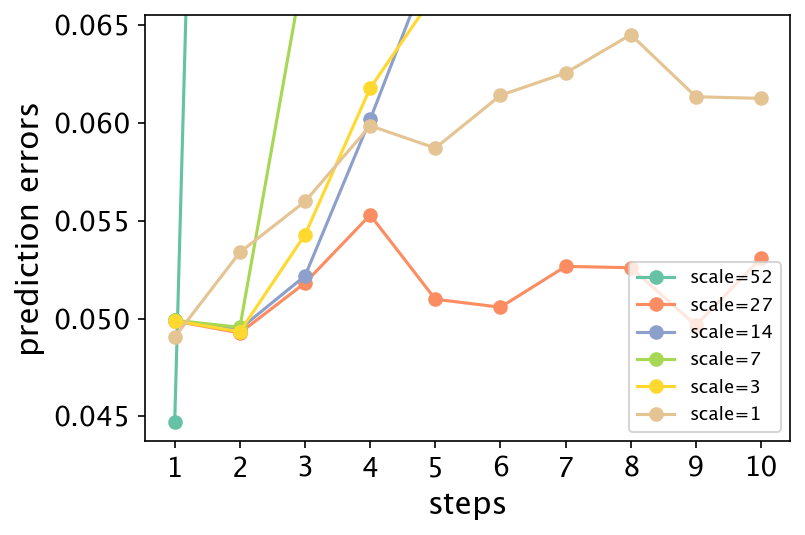

In [20]:
#
cmap=plt.get_cmap('Set2')
colors=cmap(np.linspace(0,1,7))
#
std_52=np.std(error_collection_52,(0,1))
#
std_27=np.mean(error_collection_27,(0,1))
#
std_14=np.std(error_collection_14,(0,1))
#
std_7=np.std(error_collection_7,(0,1))
#
std_3=np.std(error_collection_3,(0,1))
#
std_1=np.mean(error_collection_1,(0,1))
upper_bound_1=mean_1+np.std(error_collection_1,(0,1))
lower_bound_1=mean_1-np.std(error_collection_1,(0,1))

# Create a figure and axis object
fig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150)

# Plot the data
ax.plot(mean_52,marker='o',c=colors[0])
ax.plot(mean_27,marker='o',c=colors[1])
ax.plot(mean_14,marker='o',c=colors[2])
ax.plot(mean_7,marker='o',c=colors[3])
ax.plot(mean_3,marker='o',c=colors[4])
ax.plot(mean_1,marker='o',c=colors[5])

'''
#
ax.fill_between(range(len(mean_27)), lower_bound_52, upper_bound_52, alpha=0.1,color=colors[5])
ax.fill_between(range(len(mean_27)), lower_bound_27, upper_bound_27, alpha=0.1,color=colors[1])
ax.fill_between(range(len(mean_27)), lower_bound_14, upper_bound_14, alpha=0.1,color=colors[2])
ax.fill_between(range(len(mean_27)), lower_bound_7, upper_bound_7, alpha=0.1,color=colors[3])
ax.fill_between(range(len(mean_27)), lower_bound_3, upper_bound_3, alpha=0.1,color=colors[4])
ax.fill_between(range(len(mean_27)), lower_bound_1, upper_bound_1, alpha=0.2,color=colors[0])
'''
# 添加刻度标签
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)

ax.set_xticks(bar_positions)
ax.set_xticklabels(scale)

plt.xlabel('steps',fontsize=15)
plt.ylabel('prediction errors',fontsize=15)
plt.ylim([mean_52.min()-1e-3,mean_1.max()+1e-3])
#plt.yscale('log')

plt.legend(['scale=52','scale=27','scale=14',
            'scale=7','scale=3','scale=1'],loc='lower right',fontsize=9)
plt.show()

In [269]:
mean_1=np.mean(error_collection_1/(real.max()-real.min()),(0,1))
mean_3=np.mean(error_collection_3/(real.max()-real.min()),(0,1))
mean_7=np.mean(error_collection_7/(real.max()-real.min()),(0,1))
mean_14=np.mean(error_collection_14/(real.max()-real.min()),(0,1))
mean_27=np.mean(error_collection_27/(real.max()-real.min()),(0,1))
mean_52=np.mean(error_collection_52/(real.max()-real.min()),(0,1))

In [206]:
'''
mean_1=np.mean(error_collection_1,(0,1))/(np.max(real,(0,1))-np.min(real,(0,1)))
mean_3=np.mean(error_collection_3,(0,1))/(np.max(real,(0,1))-np.min(real,(0,1)))
mean_7=np.mean(error_collection_7,(0,1))/(np.max(real,(0,1))-np.min(real,(0,1)))
mean_14=np.mean(error_collection_14,(0,1))/(np.max(real,(0,1))-np.min(real,(0,1)))
mean_27=np.mean(error_collection_27,(0,1))/(np.max(real,(0,1))-np.min(real,(0,1)))
mean_52=np.mean(error_collection_52,(0,1))/(np.max(real,(0,1))-np.min(real,(0,1)))
'''

'\nmean_1=np.mean(error_collection_1,(0,1))/(np.max(real,(0,1))-np.min(real,(0,1)))\nmean_3=np.mean(error_collection_3,(0,1))/(np.max(real,(0,1))-np.min(real,(0,1)))\nmean_7=np.mean(error_collection_7,(0,1))/(np.max(real,(0,1))-np.min(real,(0,1)))\nmean_14=np.mean(error_collection_14,(0,1))/(np.max(real,(0,1))-np.min(real,(0,1)))\nmean_27=np.mean(error_collection_27,(0,1))/(np.max(real,(0,1))-np.min(real,(0,1)))\nmean_52=np.mean(error_collection_52,(0,1))/(np.max(real,(0,1))-np.min(real,(0,1)))\n'

In [264]:
mean_1=np.mean(error_collection_1/np.abs(real),(0,1))
mean_3=np.mean(error_collection_3/np.abs(real),(0,1))
mean_7=np.mean(error_collection_7/np.abs(real),(0,1))
mean_14=np.mean(error_collection_14/np.abs(real),(0,1))
mean_27=np.mean(error_collection_27/np.abs(real),(0,1))
mean_52=np.mean(error_collection_52/np.abs(real),(0,1))

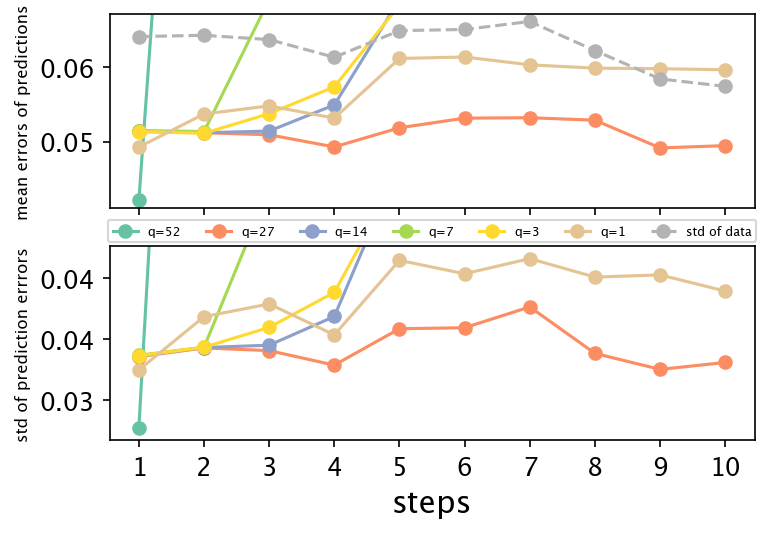

In [29]:
#
cmap=plt.get_cmap('Set2')
colors=cmap(np.linspace(0,1,7))

#
mean_52=np.mean(error_collection_52,(0,1))
#
mean_27=np.mean(error_collection_27,(0,1))
#
mean_14=np.mean(error_collection_14,(0,1))

#
mean_7=np.mean(error_collection_7,(0,1))
#
mean_3=np.mean(error_collection_3,(0,1))
#
mean_1=np.mean(error_collection_1,(0,1))

#
#std=np.std(real/(real.max()-real.min()),(0,1))
#std=np.std(((real-real.min())/(real.max()-real.min())),(0,1))
#std_1=np.std(error_collection_1/(real.max()-real.min()),(0,1))
#std_3=np.std(error_collection_3/(real.max()-real.min()),(0,1))
#std_7=np.std(error_collection_7/(real.max()-real.min()),(0,1))
#std_14=np.std(error_collection_14/(real.max()-real.min()),(0,1))
#std_27=np.std(error_collection_27/(real.max()-real.min()),(0,1))
#std_52=np.std(error_collection_52/(real.max()-real.min()),(0,1))
std=np.std(real,(0,1))
std_1=np.std(error_collection_1,(0,1))
std_3=np.std(error_collection_3,(0,1))
std_7=np.std(error_collection_7,(0,1))
std_14=np.std(error_collection_14,(0,1))
std_27=np.std(error_collection_27,(0,1))
std_52=np.std(error_collection_52,(0,1))

# Create a figure and axis object
fig, ax = plt.subplots(2, 1, figsize=(5, 4),dpi=150,sharex=True)

# Plot the data
ax[0].plot(mean_52,marker='o',c=colors[0],label='q=52')
ax[0].plot(mean_27,marker='o',c=colors[1],label='q=27')
ax[0].plot(mean_14,marker='o',c=colors[2],label='q=14')
ax[0].plot(mean_7,marker='o',c=colors[3],label='q=7')
ax[0].plot(mean_3,marker='o',c=colors[4],label='q=3')
ax[0].plot(mean_1,marker='o',c=colors[5],label='q=1')
ax[0].plot(std,marker='o',linestyle='--',c=colors[6],label='std of data')

ax[1].plot(std_52,marker='o',c=colors[0])
ax[1].plot(std_27,marker='o',c=colors[1])
ax[1].plot(std_14,marker='o',c=colors[2])
ax[1].plot(std_7,marker='o',c=colors[3])
ax[1].plot(std_3,marker='o',c=colors[4])
ax[1].plot(std_1,marker='o',c=colors[5])

'''
#
ax.fill_between(range(len(mean_27)), lower_bound_52, upper_bound_52, alpha=0.1,color=colors[5])
ax.fill_between(range(len(mean_27)), lower_bound_27, upper_bound_27, alpha=0.1,color=colors[1])
ax.fill_between(range(len(mean_27)), lower_bound_14, upper_bound_14, alpha=0.1,color=colors[2])
ax.fill_between(range(len(mean_27)), lower_bound_7, upper_bound_7, alpha=0.1,color=colors[3])
ax.fill_between(range(len(mean_27)), lower_bound_3, upper_bound_3, alpha=0.1,color=colors[4])
ax.fill_between(range(len(mean_27)), lower_bound_1, upper_bound_1, alpha=0.2,color=colors[0])
'''
# 添加刻度标签
ax[0].tick_params(labelsize=12)
ax[1].tick_params(labelsize=12)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)

#ax[1].set_xticks(bar_positions)
#ax[1].set_xticklabels(scale)
ax[1].set_xticks(np.arange(10),np.arange(1,11))

ax[0].set_ylabel('mean errors of predictions',fontsize=8)
ax[0].set_ylim([mean_52.min()-1e-3,std.max()+1e-3])

ax[1].set_xlabel('steps',fontsize=15)
ax[1].set_ylabel('std of prediction errrors',fontsize=8)
ax[1].set_ylim([std_52.min()-1e-3,std_1.max()+1e-3])
#plt.yscale('log')
handles, labels = ax[0].get_legend_handles_labels()
#ax[0].legend(['scale=52','scale=27','scale=14','scale=7','scale=3','scale=1','std of data'],loc='lower right',fontsize=6.5)
ax[1].legend(handles,labels,fontsize=6,loc='center',bbox_to_anchor=(0.5,1.08),ncols=7)
plt.gca().yaxis.set_major_formatter('{:.2f}'.format)
plt.show()

In [ ]:
#
cmap=plt.get_cmap('Set2')
colors=cmap(np.linspace(0,1,7))

#
mean_52=np.mean(error_collection_52,(0,1))
#
mean_27=np.mean(error_collection_27,(0,1))
#
mean_14=np.mean(error_collection_14,(0,1))

#
mean_7=np.mean(error_collection_7,(0,1))
#
mean_3=np.mean(error_collection_3,(0,1))
#
mean_1=np.mean(error_collection_1,(0,1))

#
#std=np.std(real/(real.max()-real.min()),(0,1))
#std=np.std(((real-real.min())/(real.max()-real.min())),(0,1))
#std_1=np.std(error_collection_1/(real.max()-real.min()),(0,1))
#std_3=np.std(error_collection_3/(real.max()-real.min()),(0,1))
#std_7=np.std(error_collection_7/(real.max()-real.min()),(0,1))
#std_14=np.std(error_collection_14/(real.max()-real.min()),(0,1))
#std_27=np.std(error_collection_27/(real.max()-real.min()),(0,1))
#std_52=np.std(error_collection_52/(real.max()-real.min()),(0,1))
std=np.std(real,(0,1))
std_1=np.std(error_collection_1,(0,1))
std_3=np.std(error_collection_3,(0,1))
std_7=np.std(error_collection_7,(0,1))
std_14=np.std(error_collection_14,(0,1))
std_27=np.std(error_collection_27,(0,1))
std_52=np.std(error_collection_52,(0,1))

# Create a figure and axis object
fig, ax = plt.subplots(2, 1, figsize=(5, 4),dpi=150,sharex=True)

# Plot the data
ax[0].plot(mean_52,marker='o',c=colors[0],label='q=52')
ax[0].plot(mean_27,marker='o',c=colors[1],label='q=27')
ax[0].plot(mean_14,marker='o',c=colors[2],label='q=14')
ax[0].plot(mean_7,marker='o',c=colors[3],label='q=7')
ax[0].plot(mean_3,marker='o',c=colors[4],label='q=3')
ax[0].plot(mean_1,marker='o',c=colors[5],label='q=1')
ax[0].plot(std,marker='o',linestyle='--',c=colors[6],label='std of data')

ax[1].plot(std_52,marker='o',c=colors[0])
ax[1].plot(std_27,marker='o',c=colors[1])
ax[1].plot(std_14,marker='o',c=colors[2])
ax[1].plot(std_7,marker='o',c=colors[3])
ax[1].plot(std_3,marker='o',c=colors[4])
ax[1].plot(std_1,marker='o',c=colors[5])

'''
#
ax.fill_between(range(len(mean_27)), lower_bound_52, upper_bound_52, alpha=0.1,color=colors[5])
ax.fill_between(range(len(mean_27)), lower_bound_27, upper_bound_27, alpha=0.1,color=colors[1])
ax.fill_between(range(len(mean_27)), lower_bound_14, upper_bound_14, alpha=0.1,color=colors[2])
ax.fill_between(range(len(mean_27)), lower_bound_7, upper_bound_7, alpha=0.1,color=colors[3])
ax.fill_between(range(len(mean_27)), lower_bound_3, upper_bound_3, alpha=0.1,color=colors[4])
ax.fill_between(range(len(mean_27)), lower_bound_1, upper_bound_1, alpha=0.2,color=colors[0])
'''
# 添加刻度标签
ax[0].tick_params(labelsize=12)
ax[1].tick_params(labelsize=12)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)

#ax[1].set_xticks(bar_positions)
#ax[1].set_xticklabels(scale)
ax[1].set_xticks(np.arange(10),np.arange(1,11))

ax[0].set_ylabel('mean errors of predictions',fontsize=8)
ax[0].set_ylim([mean_52.min()-1e-3,std.max()+1e-3])

ax[1].set_xlabel('steps',fontsize=15)
ax[1].set_ylabel('std of prediction errrors',fontsize=8)
ax[1].set_ylim([std_52.min()-1e-3,std_1.max()+1e-3])
#plt.yscale('log')
handles, labels = ax[0].get_legend_handles_labels()
#ax[0].legend(['scale=52','scale=27','scale=14','scale=7','scale=3','scale=1','std of data'],loc='lower right',fontsize=6.5)
ax[1].legend(handles,labels,fontsize=6,loc='center',bbox_to_anchor=(0.5,1.08),ncols=7)
plt.gca().yaxis.set_major_formatter('{:.2f}'.format)
plt.show()

In [39]:
(mean_52/std).min()

0.65565675

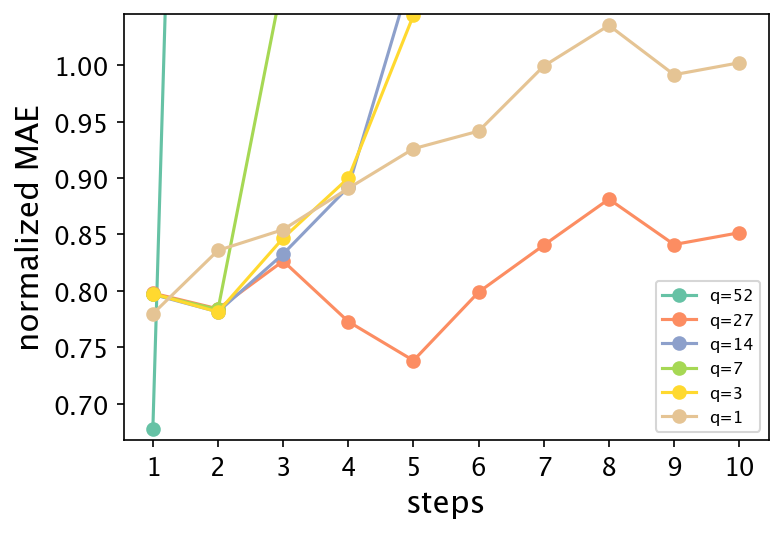

In [14]:
#
cmap=plt.get_cmap('Set2')
colors=cmap(np.linspace(0,1,7))

#
mean_52=np.mean(error_collection_52,(0,1))
#
mean_27=np.mean(error_collection_27,(0,1))
#
mean_14=np.mean(error_collection_14,(0,1))

#
mean_7=np.mean(error_collection_7,(0,1))
#
mean_3=np.mean(error_collection_3,(0,1))
#
mean_1=np.mean(error_collection_1,(0,1))

#
#std=np.std(real/(real.max()-real.min()),(0,1))
#std=np.std(((real-real.min())/(real.max()-real.min())),(0,1))
#std_1=np.std(error_collection_1/(real.max()-real.min()),(0,1))
#std_3=np.std(error_collection_3/(real.max()-real.min()),(0,1))
#std_7=np.std(error_collection_7/(real.max()-real.min()),(0,1))
#std_14=np.std(error_collection_14/(real.max()-real.min()),(0,1))
#std_27=np.std(error_collection_27/(real.max()-real.min()),(0,1))
#std_52=np.std(error_collection_52/(real.max()-real.min()),(0,1))
std=np.std(real)
std_1=np.std(error_collection_1,(0,1))
std_3=np.std(error_collection_3,(0,1))
std_7=np.std(error_collection_7,(0,1))
std_14=np.std(error_collection_14,(0,1))
std_27=np.std(error_collection_27,(0,1))
std_52=np.std(error_collection_52,(0,1))

# Create a figure and axis object
fig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150,sharex=True)

# Plot the data
ax.plot(mean_52/std,marker='o',c=colors[0],label='q=52')
ax.plot(mean_27/std,marker='o',c=colors[1],label='q=27')
ax.plot(mean_14/std,marker='o',c=colors[2],label='q=14')
ax.plot(mean_7/std,marker='o',c=colors[3],label='q=7')
ax.plot(mean_3/std,marker='o',c=colors[4],label='q=3')
ax.plot(mean_1/std,marker='o',c=colors[5],label='q=1')
#ax.plot(std,marker='o',linestyle='--',c=colors[6],label='std of data')

'''
#
ax.fill_between(range(len(mean_27)), lower_bound_52, upper_bound_52, alpha=0.1,color=colors[5])
ax.fill_between(range(len(mean_27)), lower_bound_27, upper_bound_27, alpha=0.1,color=colors[1])
ax.fill_between(range(len(mean_27)), lower_bound_14, upper_bound_14, alpha=0.1,color=colors[2])
ax.fill_between(range(len(mean_27)), lower_bound_7, upper_bound_7, alpha=0.1,color=colors[3])
ax.fill_between(range(len(mean_27)), lower_bound_3, upper_bound_3, alpha=0.1,color=colors[4])
ax.fill_between(range(len(mean_27)), lower_bound_1, upper_bound_1, alpha=0.2,color=colors[0])
'''
# 添加刻度标签
ax.tick_params(labelsize=12)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)

#ax[1].set_xticks(bar_positions)
#ax[1].set_xticklabels(scale)
ax.set_xticks(np.arange(10),np.arange(1,11))

ax.set_xlabel('steps',fontsize=15)
ax.set_ylabel('normalized MAE',fontsize=15)
ax.set_ylim([(mean_52/std).min()-1e-2,(mean_1/std).max()+1e-2])

#plt.yscale('log')
handles, labels = ax.get_legend_handles_labels()
#ax[0].legend(['scale=52','scale=27','scale=14','scale=7','scale=3','scale=1','std of data'],loc='lower right',fontsize=6.5)
#ax.legend(handles,labels,fontsize=6,loc='center',bbox_to_anchor=(0.5,1.08),ncols=7)
ax.legend(handles,labels,fontsize=8)
plt.gca().yaxis.set_major_formatter('{:.2f}'.format)
plt.show()

# Intepretation

In [15]:
def encoding_function_1(input_data):
    return net.encoding(input_data)[-1]

In [25]:
#Since we can can how many number of of ROIs we want to investigate in a large range
dataset = datasets.fetch_atlas_schaefer_2018(n_rois=100)
atlas_filename = dataset.maps
labels = dataset.labels
#indices=dataset.indices
description=dataset.description

In [19]:
from captum.attr import IntegratedGradients

In [26]:
#Find out input and target
input=data[:,:-1,:]
target=data[:,1:,:]
#Where we check the integrated gradient
#the data where we check across people
input_mean=input.mean(0)
target_mean=target.mean(0)
#Choose a random time for analysis
time=np.arange(289)
baseline=torch.zeros([100])

In [26]:
'''
fake_sample=torch.randn(input_mean.shape)
ig = IntegratedGradients(encoding_function_1)
attributions, approximation_error = ig.attribute(fake_sample,method='gausslegendre',
                                                 return_convergence_delta=True)
'''

"\nfake_sample=torch.randn(input_mean.shape)\nig = IntegratedGradients(encoding_function_1)\nattributions, approximation_error = ig.attribute(fake_sample,method='gausslegendre',\n                                                 return_convergence_delta=True)\n"

In [27]:
ig = IntegratedGradients(encoding_function_1)
attributions, approximation_error = ig.attribute(input_mean,method='gausslegendre',
                                                 return_convergence_delta=True)

In [28]:
indexes=[]
for label in labels:
    if b'Vis' in label:
        indexes.append(0)
    elif b'SomMot' in label:
        indexes.append(1)
    elif b'DorsAttn' in label:
        indexes.append(2)
    elif b'SalVentAttn' in label:
        indexes.append(3)
    elif b'Limbic' in label:
        indexes.append(4)
    elif b'Cont' in label:
        indexes.append(5)
    elif b'Default' in label:
        indexes.append(6)
indexes=np.array(indexes)

In [29]:
#np.savetxt('ReconcilingEmergences/testdata/indexes.csv',indexes)

'\nax=sns.violinplot(attributions_mean)\nax.set_xticklabels(subnetworks)\n'

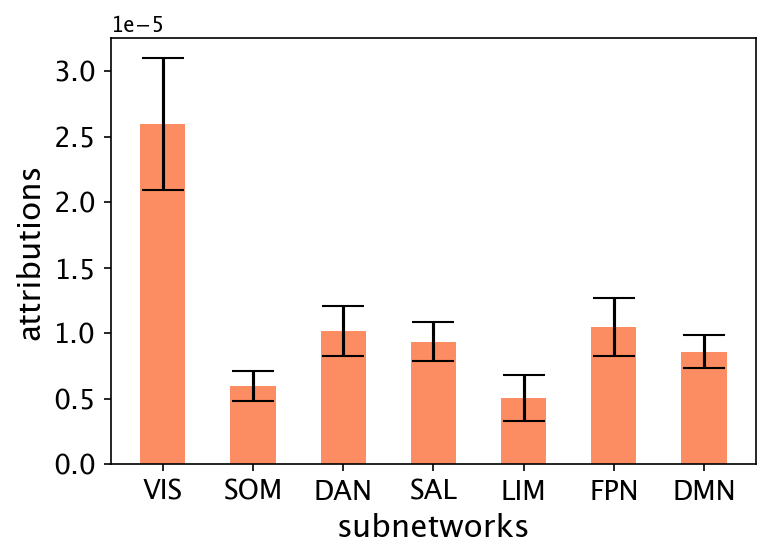

In [29]:
attributions_abs=attributions.abs()
#subnetworks=['Vis','SomMot','DorsAttn','SalVentAttn','Limbic','Cont','Default']
subnetworks=['VIS','SOM','DAN','SAL','LIM','FPN','DMN']
attributions_subnetwork=[attributions_abs[:,indexes==0],
                        attributions_abs[:,indexes==1],
                        attributions_abs[:,indexes==2],
                        attributions_abs[:,indexes==3],
                        attributions_abs[:,indexes==4],
                        attributions_abs[:,indexes==5],
                        attributions_abs[:,indexes==6]]

attributions_mean=[a.mean() for a in attributions_subnetwork]
attributions_std=[sem(a.mean(0)) for a in attributions_subnetwork]

fig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150)
ax.bar(x=subnetworks,height=attributions_mean,yerr=attributions_std,color=colors[1],width=0.5,capsize=10)
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)

plt.xlabel('subnetworks', fontsize=15)
plt.ylabel('attributions', fontsize=15)
"""
ax=sns.violinplot(attributions_mean)
ax.set_xticklabels(subnetworks)
"""

<BarContainer object of 17 artists>

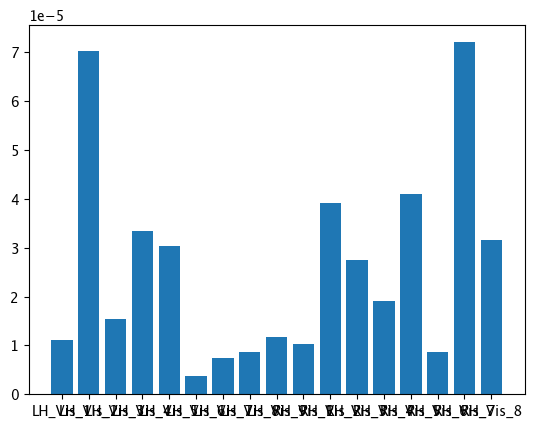

In [90]:
plt.bar(x=[str(label)[12:-1] for label in labels[indexes==0]],height=attributions_subnetwork[0].mean(0))

In [30]:
atlas_map=nib.load(atlas_filename)

In [31]:
#100 regions
stat_img=np.zeros(atlas_map.get_fdata().shape)
cmap =mcolors.LinearSegmentedColormap.from_list("n_cmap", ['#F4F1DE', '#DF7A5E'])
#attributions[:,indexes!=0]=0
attributions_normalize=attributions.abs().mean(0)/attributions.abs().mean(0).sum()
for i in range(100):
    stat_img[atlas_map.get_fdata()==i+1]=attributions_normalize[i]

In [47]:
np.where(labels==b'7Networks_RH_Vis_7')

(array([56]),)

In [43]:
(atlas_map.get_fdata()==2).sum()

9158

In [48]:
(atlas_map.get_fdata()==57).sum()

11317

In [53]:
atlas_map.get_fdata().shape

(182, 218, 182)

In [54]:
182*218*182

7221032

In [32]:
stat_img=nib.Nifti1Image(stat_img,atlas_map.affine)

In [33]:
plotting.view_img_on_surf(stat_img,cmap=plt.cm.Reds,vmin=0,symmetric_cmap=False)

In [39]:
plotting.view_img_on_surf(stat_img,cmap=plt.cm.Reds,symmetric_cmap=False,threshold='99%')

In [35]:
#100 regions
"""
attributions_collection=np.load('Attributions_NIS+.npy')
attribution_collection_abs=np.abs(attributions_collection)
attributions_subnetwork=[attribution_collection_abs[:,indexes==0].flatten(),
                        attribution_collection_abs[:,indexes==1].flatten(),
                        attribution_collection_abs[:,indexes==2].flatten(),
                        attribution_collection_abs[:,indexes==3].flatten(),
                        attribution_collection_abs[:,indexes==4].flatten(),
                        attribution_collection_abs[:,indexes==5].flatten(),
                        attribution_collection_abs[:,indexes==6].flatten()]
stat_img=np.zeros(atlas_map.get_fdata().shape)
sum=np.sum(attributions_mean)
for i in range(100):
    if indexes[i]==0:
        stat_img[atlas_map.get_fdata()==i+1]=attributions_mean[0]/sum
    elif indexes[i]==1:
        stat_img[atlas_map.get_fdata()==i+1]=attributions_mean[1]/sum
    elif indexes[i]==2:
        stat_img[atlas_map.get_fdata()==i+1]=attributions_mean[2]/sum
    elif indexes[i]==3:
        stat_img[atlas_map.get_fdata()==i+1]=attributions_mean[3]/sum
    elif indexes[i]==4:
        stat_img[atlas_map.get_fdata()==i+1]=attributions_mean[4]/sum
    elif indexes[i]==5:
        stat_img[atlas_map.get_fdata()==i+1]=attributions_mean[5]/sum
    elif indexes[i]==6:
        stat_img[atlas_map.get_fdata()==i+1]=attributions_mean[6]/sum
        
attributions_mean=[a.mean(0) for a in attributions_subnetwork]
attributions_std=[a.std(0) for a in attributions_subnetwork]

fig, ax = plt.subplots()
ax.bar(x=subnetworks,height=attributions_mean,yerr=attributions_std,color=colors[0],width=0.5)

ax=sns.violinplot(attributions_mean)
ax.set_xticklabels(subnetworks);
"""

"\nattributions_collection=np.load('Attributions_NIS+.npy')\nattribution_collection_abs=np.abs(attributions_collection)\nattributions_subnetwork=[attribution_collection_abs[:,indexes==0].flatten(),\n                        attribution_collection_abs[:,indexes==1].flatten(),\n                        attribution_collection_abs[:,indexes==2].flatten(),\n                        attribution_collection_abs[:,indexes==3].flatten(),\n                        attribution_collection_abs[:,indexes==4].flatten(),\n                        attribution_collection_abs[:,indexes==5].flatten(),\n                        attribution_collection_abs[:,indexes==6].flatten()]\nstat_img=np.zeros(atlas_map.get_fdata().shape)\nsum=np.sum(attributions_mean)\nfor i in range(100):\n    if indexes[i]==0:\n        stat_img[atlas_map.get_fdata()==i+1]=attributions_mean[0]/sum\n    elif indexes[i]==1:\n        stat_img[atlas_map.get_fdata()==i+1]=attributions_mean[1]/sum\n    elif indexes[i]==2:\n        stat_img[atlas_

In [36]:
num=8

In [37]:
important_labels=attributions.abs().mean(0).argsort()[-num:].flip(0)
unimportant_labels=attributions.abs().mean(0).argsort()[:num]

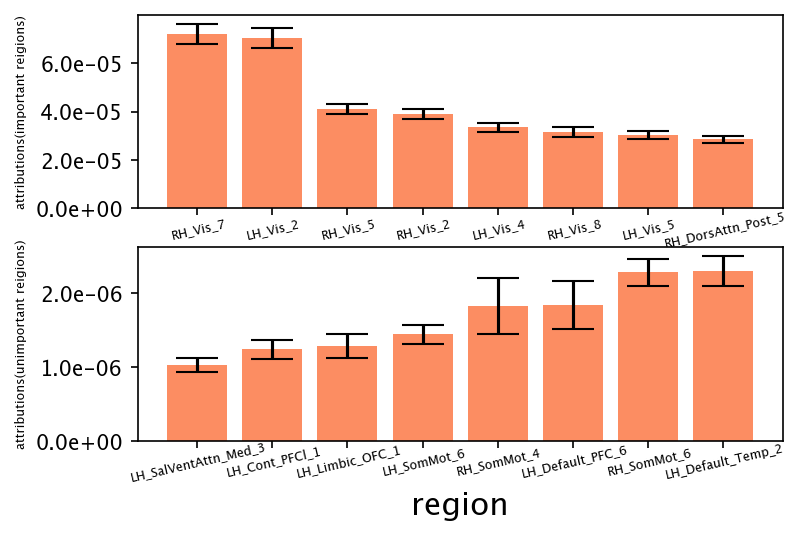

In [38]:
from matplotlib.ticker import FormatStrFormatter
fig, ax = plt.subplots(2,1, figsize=(5, 4),dpi=150)
ax[0].bar(np.arange(num),attributions.abs().mean(0)[important_labels],color=colors[1],yerr=sem(attributions.abs()[:,important_labels]),capsize=10)
ax[0].set_xticks(np.arange(num),[str(labels[i])[12:-1] for i in important_labels],wrap=True,size=6,rotation=13)
ax[0].set_ylabel('attributions(important reigions)',fontsize=6)
#plt.title('Important Features(regions) across subjects and time')
#plt.xlabel('features')
#plt.ylabel('attributions')
ax[1].bar(np.arange(num),attributions.abs().mean(0)[unimportant_labels],color=colors[1],yerr=sem(attributions.abs()[:,unimportant_labels]),capsize=10)
ax[1].set_xticks(np.arange(num),[str(labels[i])[12:-1] for i in unimportant_labels],wrap=True,size=6,rotation=13)
ax[1].set_ylabel('attributions(unimportant reigions)',fontsize=6)
#plt.margins(0.2)
#plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)
formatter = FormatStrFormatter('%.1e')
ax[0].yaxis.set_major_formatter(formatter)
ax[1].yaxis.set_major_formatter(formatter)
#plt.title('UnImportant Features across subjects and time(regions)')
plt.xlabel('region',fontsize=15)
#plt.ylabel('attributions')
plt.show()

In [39]:
'''
fig, ax = plt.subplots()
for i in range(5):
    important_data=data.mean(0)[:,important_labels[i]]
    important_data=(important_data-important_data.mean())/important_data.std()
    ax.plot(important_data.detach().numpy(),c=colors[0],label='micro_important')
    unimportant_data=data.mean(0)[:,unimportant_labels[-i]]
    unimportant_data=(unimportant_data-unimportant_data.mean())/unimportant_data.std()
    ax.plot(unimportant_data.detach().numpy(),c=colors[1],label='micro_unimportant')
macro=net.encoding(data.mean(0))[-1]
macro_normalize=(macro-macro.mean())/macro.std()
ax.plot(macro_normalize.detach().numpy(),c=colors[2],label='macro')
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=[handles[0],handles[1],handles[-1]], labels=[labels[0],labels[1],labels[-1]])
plt.show()
'''

"\nfig, ax = plt.subplots()\nfor i in range(5):\n    important_data=data.mean(0)[:,important_labels[i]]\n    important_data=(important_data-important_data.mean())/important_data.std()\n    ax.plot(important_data.detach().numpy(),c=colors[0],label='micro_important')\n    unimportant_data=data.mean(0)[:,unimportant_labels[-i]]\n    unimportant_data=(unimportant_data-unimportant_data.mean())/unimportant_data.std()\n    ax.plot(unimportant_data.detach().numpy(),c=colors[1],label='micro_unimportant')\nmacro=net.encoding(data.mean(0))[-1]\nmacro_normalize=(macro-macro.mean())/macro.std()\nax.plot(macro_normalize.detach().numpy(),c=colors[2],label='macro')\nhandles, labels = ax.get_legend_handles_labels()\nax.legend(handles=[handles[0],handles[1],handles[-1]], labels=[labels[0],labels[1],labels[-1]])\nplt.show()\n"

In [40]:
important_labels=attributions.abs().mean(0).argsort().flip(0)

In [41]:
color_values = np.linspace(0, 1, 100)
colors_Red = plt.cm.Reds(color_values)
colors_Blues= plt.cm.Blues(color_values)

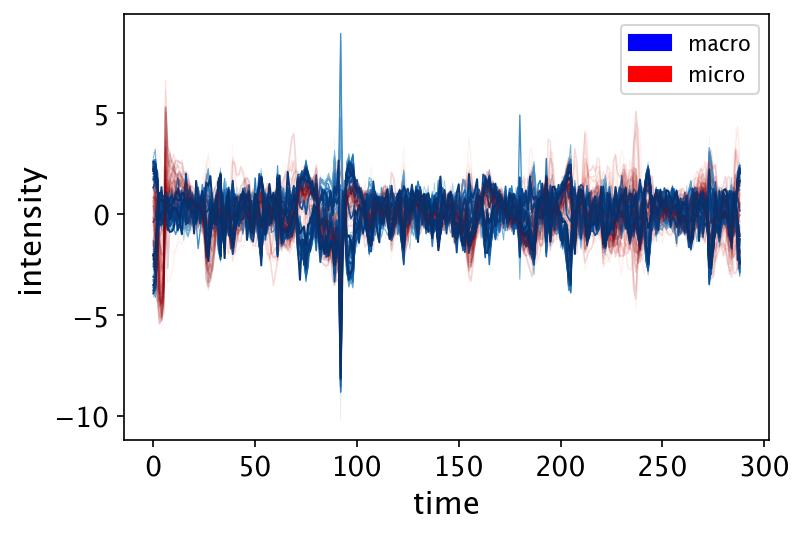

In [42]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150)

#macro=net.encoding(data.mean(0))[-1]
macro=net(data.mean(0))[0][-1]
#macro_normalize=(macro-macro.mean())/macro.std()
#ax.plot(macro_normalize.detach().numpy(),label='macro',linewidth=2)

for i in range(100):
    important_data=data.mean(0)[:,important_labels[i]]
    macro_data=macro[:,important_labels[i]]
    macro_data=(macro_data-macro_data.mean())/macro_data.std()
    important_data=(important_data-important_data.mean())/important_data.std()
    ax.plot(important_data[1:].detach().numpy(),label='micro',alpha=0.2*color_values[i],linewidth=color_values[i],color=colors_Red[i])
    ax.plot(macro_data[:-1].detach().numpy(),label='macro',linewidth=color_values[i],color=colors_Blues[i])
    
handles, labels = ax.get_legend_handles_labels()
# 创建自定义图例项
legend_item1 = mpatches.Patch(color='blue', label='macro')
legend_item2 = mpatches.Patch(color='red', label='micro')

# 将图例项添加到图例中
ax.legend(handles=[legend_item1, legend_item2])
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)
plt.xlabel('time',fontsize=15)
plt.ylabel('intensity',fontsize=15)
#ax.legend(handles=[handles[0],handles[-1]], labels=[labels[0],labels[-1]])
plt.show()

In [43]:
"""
num=3
fig, ax = plt.subplots(num, 2, figsize=(6, 4),dpi=150,sharex=True)

#macro=net.encoding(data.mean(0))[-1]
macro=net(data.mean(0))[0][-1]
#macro_normalize=(macro-macro.mean())/macro.std()
#ax.plot(macro_normalize.detach().numpy(),label='macro',linewidth=2)

for i in range(num):
    important_data=data.mean(0)[:,important_labels[i]]
    macro_data=macro[:,important_labels[i]]
    #macro_data=(macro_data-macro_data.mean())/macro_data.std()
    #important_data=(important_data-important_data.mean())/important_data.std()
    ax[i,0].plot(important_data[1:].detach().numpy(),label='micro',color='red')
    ax[i,0].plot(macro_data[:-1].detach().numpy(),label='macro',color='blue')
    #ax[i,0].set_yticks([])
    
for i in range(num):
    important_data=data.mean(0)[:,important_labels[-i-1]]
    macro_data=macro[:,important_labels[-i-1]]
    #macro_data=(macro_data-macro_data.mean())/macro_data.std()
    #important_data=(important_data-important_data.mean())/important_data.std()
    ax[i,1].plot(important_data[1:].detach().numpy(),label='micro',color='red')
    ax[i,1].plot(macro_data[:-1].detach().numpy(),label='macro',color='blue')
    #ax[i,1].set_yticks([])
 
for i in range(num):
    ax[i,0].tick_params(labelsize=10)   
    ax[i,1].tick_params(labelsize=10)  
fig.text(0.48,0,'time',fontsize=15)
ax[1,0].set_ylabel('intensity',fontsize=15,loc='center')

'''    
handles, labels = ax[0].get_legend_handles_labels()
# 创建自定义图例项
legend_item1 = mpatches.Patch(color='blue', label='macro')
legend_item2 = mpatches.Patch(color='red', label='micro')

# 将图例项添加到图例中
ax.legend(handles=[legend_item1, legend_item2])
'''    
ax[1,1].legend(['micro', 'macro-decode'],loc='upper right',fontsize=6)

plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)
#ax.legend(handles=[handles[0],handles[-1]], labels=[labels[0],labels[-1]])
plt.tight_layout()
plt.show()
"""

"\nnum=3\nfig, ax = plt.subplots(num, 2, figsize=(6, 4),dpi=150,sharex=True)\n\n#macro=net.encoding(data.mean(0))[-1]\nmacro=net(data.mean(0))[0][-1]\n#macro_normalize=(macro-macro.mean())/macro.std()\n#ax.plot(macro_normalize.detach().numpy(),label='macro',linewidth=2)\n\nfor i in range(num):\n    important_data=data.mean(0)[:,important_labels[i]]\n    macro_data=macro[:,important_labels[i]]\n    #macro_data=(macro_data-macro_data.mean())/macro_data.std()\n    #important_data=(important_data-important_data.mean())/important_data.std()\n    ax[i,0].plot(important_data[1:].detach().numpy(),label='micro',color='red')\n    ax[i,0].plot(macro_data[:-1].detach().numpy(),label='macro',color='blue')\n    #ax[i,0].set_yticks([])\n    \nfor i in range(num):\n    important_data=data.mean(0)[:,important_labels[-i-1]]\n    macro_data=macro[:,important_labels[-i-1]]\n    #macro_data=(macro_data-macro_data.mean())/macro_data.std()\n    #important_data=(important_data-important_data.mean())/important

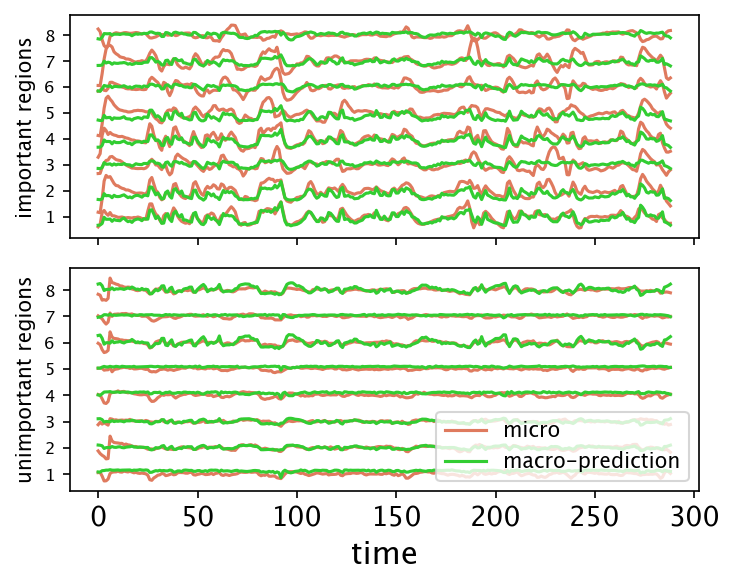

In [44]:
num=8
fig, ax = plt.subplots(2,1, figsize=(5, 4),dpi=150,sharex=True)
colors = ['#F4F1DE','#DF7A5E','#3C405B','#32CD32','#F2CC8E']
#macro=net.encoding(data.mean(0))[-1]
macro=net(data.mean(0))[0][-1]
#macro_normalize=(macro-macro.mean())/macro.std()
#ax.plot(macro_normalize.detach().numpy(),label='macro',linewidth=2)


for i in range(num):
    important_data=data.mean(0)[:,important_labels[i]]
    macro_data=macro[:,important_labels[i]]
    #macro_data=(macro_data-macro_data.mean())/macro_data.std()
    #important_data=(important_data-important_data.mean())/important_data.std()
    ax[0].plot(important_data[1:].detach().numpy()+i*0.12,label='micro',color=colors[1])
    ax[0].plot(macro_data[:-1].detach().numpy()+i*0.12,label='macro',color=colors[3])
    #ax[i,0].set_yticks([])

for i in range(num):
    important_data=data.mean(0)[:,important_labels[-i-1]]
    macro_data=macro[:,important_labels[-i-1]]
    #macro_data=(macro_data-macro_data.mean())/macro_data.std()
    #important_data=(important_data-important_data.mean())/important_data.std()
    ax[1].plot(important_data[1:].detach().numpy()+i*0.12,label='micro',color=colors[1])
    ax[1].plot(macro_data[:-1].detach().numpy()+i*0.12,label='macro',color=colors[3])
    #ax[i,1].set_yticks([])


tick_loc=np.arange(0,0.2+0.12*(num-2),0.12)
nums=np.arange(1,num+1)
#region_labels_important=region_labels[0:num]
#region_labels_important=['I'+str(nums[i]) for i in range(num)]
ax[0].set_yticks(tick_loc)
#ax[0].set_yticklabels(region_labels_important)


#region_labels_unimportant=region_labels[-num:]
#region_labels_unimportant=['U'+str(nums[i]) for i in range(num)]
ax[1].set_yticks(tick_loc)
#ax[1,1].set_yticklabels([])
#ax[1].set_yticklabels(region_labels_unimportant)


ax[0].set_ylabel('important regions',fontsize=10)
ax[1].set_ylabel('unimportant regions',fontsize=10)
 


handles, label = ax[1].get_legend_handles_labels()
"""
# 创建自定义图例项
legend_item1 = mpatches.Patch(color='blue', label='macro')
legend_item2 = mpatches.Patch(color='red', label='micro')
"""

# 将图例项添加到图例中

ax[0].tick_params(labelsize=13)   
ax[1].tick_params(labelsize=13)  

ax[0].set_yticklabels(np.arange(1,9),fontsize=8)
ax[1].set_yticklabels(np.arange(1,9),fontsize=8)

plt.xlabel('time',fontsize=15)

plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)
#plt.legend(handles=[handles[0],handles[-1]], labels=['micro','macro-prediction'],bbox_to_anchor=(1, -0.3),fontsize=10)
plt.legend(handles=[handles[0],handles[-1]], loc='lower right',labels=['micro','macro-prediction'],fontsize=10)
plt.tight_layout()
plt.show()

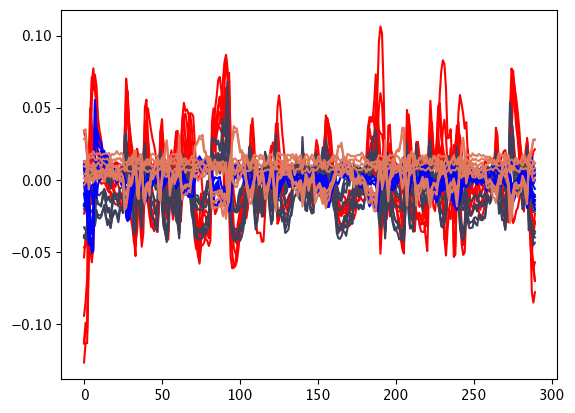

In [45]:
plt.plot(data.mean(0)[:,important_labels[:num]].detach().numpy(),color='red')
plt.plot(macro[:,important_labels[:num]].detach().numpy(),color=colors[2])
plt.plot(data.mean(0)[:,important_labels[-num:]].detach().numpy(),color='blue')
plt.plot(macro[:,important_labels[-num:]].detach().numpy(),color=colors[1])

In [46]:
"""
#Prepare for the macro data
test_data=data[-30:,:,:]
macro=torch.zeros(test_data.shape)
for i in tqdm(range(test_data.shape[0])):
    #
        macro[i,:,:]=net(test_data[i])[0][-1]

num=8
important_labels=attributions.abs().mean(0).argsort().flip(0)
fig, ax = plt.subplots(2,1, figsize=(5, 4),dpi=150,sharex=True)
colors = ['#F4F1DE','#DF7A5E','#3C405B','#32CD32','#F2CC8E']
#macro=net.encoding(data.mean(0))[-1]
#macro=net(data.mean(0))[0][-1]
#macro_normalize=(macro-macro.mean())/macro.std()
#ax.plot(macro_normalize.detach().numpy(),label='macro',linewidth=2)


for i in range(num):
    important_data=test_data.mean(0)[:,important_labels[i]]
    macro_data=macro.mean(0)[:,important_labels[i]]
    #macro_data=(macro_data-macro_data.mean())/macro_data.std()
    #important_data=(important_data-important_data.mean())/important_data.std()
    ax[0].plot(important_data[1:].detach().numpy()+i*0.12,label='micro',color=colors[1])
    ax[0].plot(macro_data[:-1].detach().numpy()+i*0.12,label='macro',color=colors[3])
    #ax[i,0].set_yticks([])

for i in range(num):
    important_data=test_data.mean(0)[:,important_labels[-i-1]]
    macro_data=macro.mean(0)[:,important_labels[-i-1]]
    #macro_data=(macro_data-macro_data.mean())/macro_data.std()
    #important_data=(important_data-important_data.mean())/important_data.std()
    ax[1].plot(important_data[1:].detach().numpy()+i*0.12,label='micro',color=colors[1])
    ax[1].plot(macro_data[:-1].detach().numpy()+i*0.12,label='macro',color=colors[3])
    #ax[i,1].set_yticks([])


tick_loc=np.arange(0,0.2+0.12*(num-2),0.12)
nums=np.arange(1,num+1)
#region_labels_important=region_labels[0:num]
#region_labels_important=['I'+str(nums[i]) for i in range(num)]
ax[0].set_yticks(tick_loc)
#ax[0].set_yticklabels(region_labels_important)


#region_labels_unimportant=region_labels[-num:]
#region_labels_unimportant=['U'+str(nums[i]) for i in range(num)]
ax[1].set_yticks(tick_loc)
#ax[1,1].set_yticklabels([])
#ax[1].set_yticklabels(region_labels_unimportant)


ax[0].set_ylabel('important regions',fontsize=10)
ax[1].set_ylabel('unimportant regions',fontsize=10)
 


handles, label = ax[1].get_legend_handles_labels()

# 创建自定义图例项
legend_item1 = mpatches.Patch(color='blue', label='macro')
legend_item2 = mpatches.Patch(color='red', label='micro')


# 将图例项添加到图例中

ax[0].tick_params(labelsize=13)   
ax[1].tick_params(labelsize=13)  

ax[0].set_yticklabels(np.arange(1,num+1),fontsize=8)
ax[1].set_yticklabels(np.arange(1,num+1),fontsize=8)

plt.xlabel('time',fontsize=15)

plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)
#plt.legend(handles=[handles[0],handles[-1]], labels=['micro','macro-prediction'],bbox_to_anchor=(1, -0.3),fontsize=10)
plt.legend(handles=[handles[0],handles[-1]], loc='lower right',labels=['micro','macro-prediction'],fontsize=10)
plt.tight_layout()
plt.show()
"""

"\n#Prepare for the macro data\ntest_data=data[-30:,:,:]\nmacro=torch.zeros(test_data.shape)\nfor i in tqdm(range(test_data.shape[0])):\n    #\n        macro[i,:,:]=net(test_data[i])[0][-1]\n\nnum=8\nimportant_labels=attributions.abs().mean(0).argsort().flip(0)\nfig, ax = plt.subplots(2,1, figsize=(5, 4),dpi=150,sharex=True)\ncolors = ['#F4F1DE','#DF7A5E','#3C405B','#32CD32','#F2CC8E']\n#macro=net.encoding(data.mean(0))[-1]\n#macro=net(data.mean(0))[0][-1]\n#macro_normalize=(macro-macro.mean())/macro.std()\n#ax.plot(macro_normalize.detach().numpy(),label='macro',linewidth=2)\n\n\nfor i in range(num):\n    important_data=test_data.mean(0)[:,important_labels[i]]\n    macro_data=macro.mean(0)[:,important_labels[i]]\n    #macro_data=(macro_data-macro_data.mean())/macro_data.std()\n    #important_data=(important_data-important_data.mean())/important_data.std()\n    ax[0].plot(important_data[1:].detach().numpy()+i*0.12,label='micro',color=colors[1])\n    ax[0].plot(macro_data[:-1].detach().n

In [47]:
'''
plt.plot(test_data.mean(0)[:,important_labels[:num]].detach().numpy(),color='red')
plt.plot(macro.mean(0)[:,important_labels[:num]].detach().numpy(),color=colors[2])
plt.plot(data.mean(0)[:,important_labels[-num:]].detach().numpy(),color='blue')
plt.plot(macro.mean(0)[:,important_labels[-num:]].detach().numpy(),color=colors[1])
plt.show()
'''

"\nplt.plot(test_data.mean(0)[:,important_labels[:num]].detach().numpy(),color='red')\nplt.plot(macro.mean(0)[:,important_labels[:num]].detach().numpy(),color=colors[2])\nplt.plot(data.mean(0)[:,important_labels[-num:]].detach().numpy(),color='blue')\nplt.plot(macro.mean(0)[:,important_labels[-num:]].detach().numpy(),color=colors[1])\nplt.show()\n"

In [48]:
attribution_collection=np.load('Attributions_NIS+.npy')
attribution_collection=attribution_collection.reshape(data.shape)
attribution_collection=np.abs(attribution_collection)

In [49]:
attribution_collection=attribution_collection/attribution_collection.sum(2)[:,:,np.newaxis]

In [50]:
attributions_abs=attribution_collection.mean(1)

'\nax=sns.violinplot(attributions_mean)\nax.set_xticklabels(subnetworks)\n'

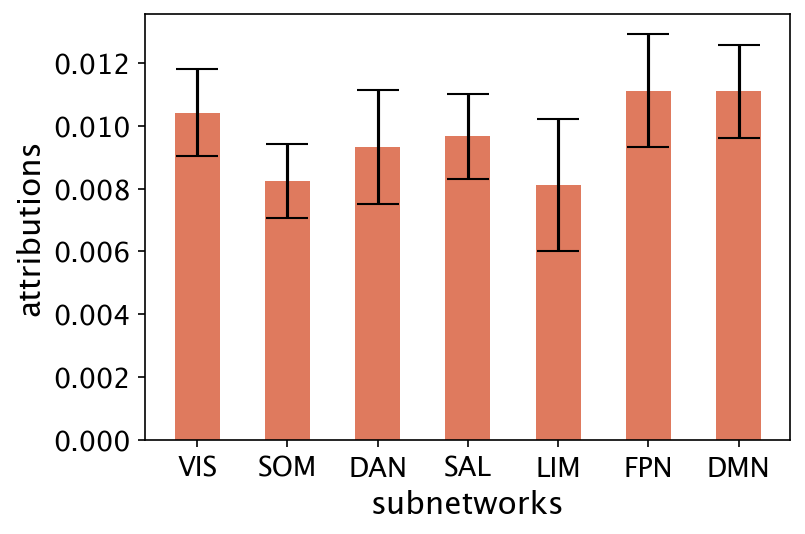

In [51]:
#attributions_abs=attributions.abs()
#subnetworks=['Vis','SomMot','DorsAttn','SalVentAttn','Limbic','Cont','Default']
subnetworks=['VIS','SOM','DAN','SAL','LIM','FPN','DMN']
attributions_subnetwork=[attributions_abs[:,indexes==0],
                        attributions_abs[:,indexes==1],
                        attributions_abs[:,indexes==2],
                        attributions_abs[:,indexes==3],
                        attributions_abs[:,indexes==4],
                        attributions_abs[:,indexes==5],
                        attributions_abs[:,indexes==6]]

attributions_mean=[a.mean() for a in attributions_subnetwork]
attributions_std=[sem(a.mean(0)) for a in attributions_subnetwork]

fig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150)
ax.bar(x=subnetworks,height=attributions_mean,yerr=attributions_std,color=colors[1],width=0.5,capsize=10)
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)

plt.xlabel('subnetworks', fontsize=15)
plt.ylabel('attributions', fontsize=15)
"""
ax=sns.violinplot(attributions_mean)
ax.set_xticklabels(subnetworks)
"""

In [52]:
"""
important_labels=attributions.abs().mean(0).argsort().flip(0)
fig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150,sharex=True,sharey=True)

#macro=net.encoding(data.mean(0))[-1]
macro=net(data.mean(0))[0][-1]
macro=macro[:,important_labels]
macro_data=((macro-macro.mean(0))/macro.std(0))

important=data.mean(0)
important=important[:,important_labels]
important_data=((important-important.mean(0))/important.std(0))

#macro_normalize=(macro-macro.mean())/macro.std()
#ax.plot(macro_normalize.detach().numpy(),label='macro',linewidth=2)

#ax[0].imshow(important_data[1:,:].detach().numpy().transpose(),label='micro',cmap=plt.cm.Reds)
#ax[1].imshow(macro_data[:-1,:].detach().numpy().transpose(),label='macro',cmap=plt.cm.Blues)
#diff=important[1:,:].detach().numpy().transpose()-macro[:-1,:].detach().numpy().transpose()
#sns.heatmap(diff,label='macro',cmap="coolwarm",cbar=True)
diff=np.abs(important[1:,:].detach().numpy().transpose()-macro[:-1,:].detach().numpy().transpose())
sns.heatmap(diff,label='macro',cmap="Reds",cbar=True)


  
#handles, labels = ax.get_legend_handles_labels()
# 创建自定义图例项
#legend_item1 = mpatches.Patch(color='blue', label='macro')
#legend_item2 = mpatches.Patch(color='red', label='micro')

# 将图例项添加到图例中
#ax.legend(handles=[legend_item1, legend_item2])
plt.tick_params(labelsize=13)
plt.xticks([])
plt.yticks([])
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)
plt.xlabel('time',fontsize=15)
plt.ylabel('regions',fontsize=15)
#ax.legend(handles=[handles[0],handles[-1]], labels=[labels[0],labels[-1]])
plt.show()
"""

'\nimportant_labels=attributions.abs().mean(0).argsort().flip(0)\nfig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150,sharex=True,sharey=True)\n\n#macro=net.encoding(data.mean(0))[-1]\nmacro=net(data.mean(0))[0][-1]\nmacro=macro[:,important_labels]\nmacro_data=((macro-macro.mean(0))/macro.std(0))\n\nimportant=data.mean(0)\nimportant=important[:,important_labels]\nimportant_data=((important-important.mean(0))/important.std(0))\n\n#macro_normalize=(macro-macro.mean())/macro.std()\n#ax.plot(macro_normalize.detach().numpy(),label=\'macro\',linewidth=2)\n\n#ax[0].imshow(important_data[1:,:].detach().numpy().transpose(),label=\'micro\',cmap=plt.cm.Reds)\n#ax[1].imshow(macro_data[:-1,:].detach().numpy().transpose(),label=\'macro\',cmap=plt.cm.Blues)\n#diff=important[1:,:].detach().numpy().transpose()-macro[:-1,:].detach().numpy().transpose()\n#sns.heatmap(diff,label=\'macro\',cmap="coolwarm",cbar=True)\ndiff=np.abs(important[1:,:].detach().numpy().transpose()-macro[:-1,:].detach().numpy().tra

In [53]:
"""
fig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150)

#macro=net.encoding(data.mean(0))[-1]
#macro=net(data.mean(0))[0][-1]
macro=net.dynamics_modules[-1](net.encoding(data.mean(0))[-1])
macro_normalize=(macro-macro.mean())/macro.std()
ax.plot(macro_normalize.detach().numpy(),label='macro',linewidth=2)

for i in range(100):
    important_data=data.mean(0)[:,important_labels[i]]
    #macro_data=macro_normalize[:,important_labels[i]]
    important_data=(important_data-important_data.mean())/important_data.std()
    ax.plot(important_data[1:].detach().numpy(),label='micro',alpha=0.2*color_values[i],linewidth=color_values[i],color=colors_Red[i])
    #ax.plot(macro_data[:-1].detach().numpy(),label='macro',linewidth=color_values[i],color=colors_Grey[i])
    
handles, labels = ax.get_legend_handles_labels()
# 创建自定义图例项
legend_item1 = mpatches.Patch(color='blue', label='macro')
legend_item2 = mpatches.Patch(color='red', label='micro')

# 将图例项添加到图例中
ax.legend(handles=[legend_item1, legend_item2])
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)
plt.xlabel('time',fontsize=15)
plt.ylabel('intensity',fontsize=15)
#ax.legend(handles=[handles[0],handles[-1]], labels=[labels[0],labels[-1]])
plt.show()
"""

"\nfig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150)\n\n#macro=net.encoding(data.mean(0))[-1]\n#macro=net(data.mean(0))[0][-1]\nmacro=net.dynamics_modules[-1](net.encoding(data.mean(0))[-1])\nmacro_normalize=(macro-macro.mean())/macro.std()\nax.plot(macro_normalize.detach().numpy(),label='macro',linewidth=2)\n\nfor i in range(100):\n    important_data=data.mean(0)[:,important_labels[i]]\n    #macro_data=macro_normalize[:,important_labels[i]]\n    important_data=(important_data-important_data.mean())/important_data.std()\n    ax.plot(important_data[1:].detach().numpy(),label='micro',alpha=0.2*color_values[i],linewidth=color_values[i],color=colors_Red[i])\n    #ax.plot(macro_data[:-1].detach().numpy(),label='macro',linewidth=color_values[i],color=colors_Grey[i])\n    \nhandles, labels = ax.get_legend_handles_labels()\n# 创建自定义图例项\nlegend_item1 = mpatches.Patch(color='blue', label='macro')\nlegend_item2 = mpatches.Patch(color='red', label='micro')\n\n# 将图例项添加到图例中\nax.legend(handles=[leg

In [54]:
"""
input=data.reshape(-1,data.shape[-1])
indexes=np.random.choice(input.shape[0],50000,replace=False)
macro_data=net.encoding(input[indexes,:])[-1]
print(macro_data.min())
print(macro_data.max())
"""

'\ninput=data.reshape(-1,data.shape[-1])\nindexes=np.random.choice(input.shape[0],50000,replace=False)\nmacro_data=net.encoding(input[indexes,:])[-1]\nprint(macro_data.min())\nprint(macro_data.max())\n'

In [55]:
#Visulization of encoding function
'''
colors = sns.color_palette('pastel', n_colors=3)
x=torch.linspace(0.001334,.001335,50).view(-1,1)
#x=torch.linspace(0.00133431596,0.00133431600,1000).view(-1,1)
y1=net.dynamics_modules[-1](x)
y2=net.dynamics_modules[-1](y1)
y3=net.dynamics_modules[-1](y2)
y4=net.dynamics_modules[-1](y3)
y5=net.dynamics_modules[-1](y4)
y6=net.dynamics_modules[-1](y5)

fig, axs=plt.subplots(1,1)

axs.plot(x[:,0].detach().numpy(),y1[:,0].detach().numpy(),color=colors[0],marker='o',linestyle='--')
axs.plot(x[:,0].detach().numpy(),x[:,0].detach().numpy(),color=colors[1])
#axs[1].plot(y1[:,0].detach().numpy(),y2[:,0].detach().numpy())
#axs[2].plot(y3[:,0].detach().numpy(),y4[:,0].detach().numpy())
#axs[3].plot(y4[:,0].detach().numpy(),y5[:,0].detach().numpy())
#axs[4].plot(y5[:,0].detach().numpy(),y6[:,0].detach().numpy())
'''

"\ncolors = sns.color_palette('pastel', n_colors=3)\nx=torch.linspace(0.001334,.001335,50).view(-1,1)\n#x=torch.linspace(0.00133431596,0.00133431600,1000).view(-1,1)\ny1=net.dynamics_modules[-1](x)\ny2=net.dynamics_modules[-1](y1)\ny3=net.dynamics_modules[-1](y2)\ny4=net.dynamics_modules[-1](y3)\ny5=net.dynamics_modules[-1](y4)\ny6=net.dynamics_modules[-1](y5)\n\nfig, axs=plt.subplots(1,1)\n\naxs.plot(x[:,0].detach().numpy(),y1[:,0].detach().numpy(),color=colors[0],marker='o',linestyle='--')\naxs.plot(x[:,0].detach().numpy(),x[:,0].detach().numpy(),color=colors[1])\n#axs[1].plot(y1[:,0].detach().numpy(),y2[:,0].detach().numpy())\n#axs[2].plot(y3[:,0].detach().numpy(),y4[:,0].detach().numpy())\n#axs[3].plot(y4[:,0].detach().numpy(),y5[:,0].detach().numpy())\n#axs[4].plot(y5[:,0].detach().numpy(),y6[:,0].detach().numpy())\n"

In [56]:
"""
#Visulization of encoding function
colors = ['#F4F1DE','#DF7A5E','#3C405B','#82B29A','#F2CC8E']
x=torch.linspace(0.001334305,.00133432,40).view(-1,1)
#x=torch.linspace(0.00133431596,0.00133431600,1000).view(-1,1)
y1=net.dynamics_modules[-1](x)
y1=y1+x
y2=net.dynamics_modules[-1](y1)
y3=net.dynamics_modules[-1](y2)
y4=net.dynamics_modules[-1](y3)
y5=net.dynamics_modules[-1](y4)
y6=net.dynamics_modules[-1](y5)

fig, axs=plt.subplots(1,1,figsize=(5,4))

axs.plot(x[:,0].detach().numpy(),y1[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')
#axs.plot(x[:,0].detach().numpy(),x[:,0].detach().numpy(),color=colors[4])
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)
#plt.xlabel('time',fontsize=15)
#plt.ylabel('Intensity',fontsize=15)
#plt.xlabel('$y_t$');
#plt.ylabel('y_{t+1}');
#axs[1].plot(y1[:,0].detach().numpy(),y2[:,0].detach().numpy())
#axs[2].plot(y3[:,0].detach().numpy(),y4[:,0].detach().numpy())
#axs[3].plot(y4[:,0].detach().numpy(),y5[:,0].detach().numpy())
#axs[4].plot(y5[:,0].detach().numpy(),y6[:,0].detach().numpy())
plt.show()
"""

"\n#Visulization of encoding function\ncolors = ['#F4F1DE','#DF7A5E','#3C405B','#82B29A','#F2CC8E']\nx=torch.linspace(0.001334305,.00133432,40).view(-1,1)\n#x=torch.linspace(0.00133431596,0.00133431600,1000).view(-1,1)\ny1=net.dynamics_modules[-1](x)\ny1=y1+x\ny2=net.dynamics_modules[-1](y1)\ny3=net.dynamics_modules[-1](y2)\ny4=net.dynamics_modules[-1](y3)\ny5=net.dynamics_modules[-1](y4)\ny6=net.dynamics_modules[-1](y5)\n\nfig, axs=plt.subplots(1,1,figsize=(5,4))\n\naxs.plot(x[:,0].detach().numpy(),y1[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')\n#axs.plot(x[:,0].detach().numpy(),x[:,0].detach().numpy(),color=colors[4])\nplt.tick_params(labelsize=13)\nplt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,\n                    wspace=0.25, hspace=0.2)\n#plt.xlabel('time',fontsize=15)\n#plt.ylabel('Intensity',fontsize=15)\n#plt.xlabel('$y_t$');\n#plt.ylabel('y_{t+1}');\n#axs[1].plot(y1[:,0].detach().numpy(),y2[:,0].detach().numpy())\n#axs[2].plot(y3[:,0].d

In [57]:
"""
#Visulization of encoding function

x=torch.linspace(-0.033,-0.02,40).view(-1,1)
#x=torch.linspace(-1,1,100).view(-1,1)
#x=torch.linspace(0.00133431596,0.00133431600,1000).view(-1,1)
y1=net.dynamics_modules[-1](x)
y1=y1+x
y2=net.dynamics_modules[-1](y1)
y3=net.dynamics_modules[-1](y2)
y4=net.dynamics_modules[-1](y3)
y5=net.dynamics_modules[-1](y4)
y6=net.dynamics_modules[-1](y5)
#x=(x-x.mean())/x.std()
#y1=(y1-y1.mean())/y1.std()

fig, ax=plt.subplots(1,1)

#ax[0].plot(x[:,0].detach().numpy(),y1[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')
ax.plot(x[:,0].detach().numpy(),y1[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')
ax.plot(x[:,0].detach().numpy(),x[:,0].detach().numpy(),color=colors[4])
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)
#ax.set_xlabel('$y_t$')
#ax.set_ylabel('$y_{t+1}$')
#axs.plot(x[:,0].detach().numpy(),x[:,0].detach().numpy(),color=colors[1])
#ax[1].plot(y1[:,0].detach().numpy(),y2[:,0].detach().numpy())
#ax[2].plot(y3[:,0].detach().numpy(),y4[:,0].detach().numpy())
#ax[3].plot(y4[:,0].detach().numpy(),y5[:,0].detach().numpy())
#ax[4].plot(y5[:,0].detach().numpy(),y6[:,0].detach().numpy())
"""

"\n#Visulization of encoding function\n\nx=torch.linspace(-0.033,-0.02,40).view(-1,1)\n#x=torch.linspace(-1,1,100).view(-1,1)\n#x=torch.linspace(0.00133431596,0.00133431600,1000).view(-1,1)\ny1=net.dynamics_modules[-1](x)\ny1=y1+x\ny2=net.dynamics_modules[-1](y1)\ny3=net.dynamics_modules[-1](y2)\ny4=net.dynamics_modules[-1](y3)\ny5=net.dynamics_modules[-1](y4)\ny6=net.dynamics_modules[-1](y5)\n#x=(x-x.mean())/x.std()\n#y1=(y1-y1.mean())/y1.std()\n\nfig, ax=plt.subplots(1,1)\n\n#ax[0].plot(x[:,0].detach().numpy(),y1[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')\nax.plot(x[:,0].detach().numpy(),y1[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')\nax.plot(x[:,0].detach().numpy(),x[:,0].detach().numpy(),color=colors[4])\nplt.tick_params(labelsize=13)\nplt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,\n                    wspace=0.25, hspace=0.2)\n#ax.set_xlabel('$y_t$')\n#ax.set_ylabel('$y_{t+1}$')\n#axs.plot(x[:,0].detach().numpy(),x[:,0]

In [58]:
"""
#Visulization of encoding function

#x=torch.linspace(-0.033,-0.02,40).view(-1,1)
x=torch.linspace(-0.028,-0.0225,40).view(-1,1)

#x=torch.linspace(-1,1,100).view(-1,1)
#x=torch.linspace(0.00133431596,0.00133431600,1000).view(-1,1)
y1=net.dynamics_modules[-1](x)
y1=y1+x
y2=net.dynamics_modules[-1](y1)
y2=y2+y1
y3=net.dynamics_modules[-1](y2)
y3=y3+y2
y4=net.dynamics_modules[-1](y3)
y4=y4+y3
y5=net.dynamics_modules[-1](y4)
y5=y5+y4
y6=net.dynamics_modules[-1](y5)
y6=y6+y5
#x=(x-x.mean())/x.std()
#y1=(y1-y1.mean())/y1.std()

fig, axs=plt.subplots(5,1)

axs[0].plot(x[:,0].detach().numpy(),y1[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')
#ax.plot(x[:,0].detach().numpy(),y1[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')
#ax.plot(x[:,0].detach().numpy(),-x[:,0].detach().numpy(),color=colors[4])
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)
#ax.set_xlabel('$y_t$')
#ax.set_ylabel('$y_{t+1}$')
#axs.plot(x[:,0].detach().numpy(),x[:,0].detach().numpy(),color=colors[1])
axs[1].plot(y1[:,0].detach().numpy(),y2[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')
axs[2].plot(y3[:,0].detach().numpy(),y4[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')
axs[3].plot(y4[:,0].detach().numpy(),y5[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')
axs[4].plot(y5[:,0].detach().numpy(),y6[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')
"""

"\n#Visulization of encoding function\n\n#x=torch.linspace(-0.033,-0.02,40).view(-1,1)\nx=torch.linspace(-0.028,-0.0225,40).view(-1,1)\n\n#x=torch.linspace(-1,1,100).view(-1,1)\n#x=torch.linspace(0.00133431596,0.00133431600,1000).view(-1,1)\ny1=net.dynamics_modules[-1](x)\ny1=y1+x\ny2=net.dynamics_modules[-1](y1)\ny2=y2+y1\ny3=net.dynamics_modules[-1](y2)\ny3=y3+y2\ny4=net.dynamics_modules[-1](y3)\ny4=y4+y3\ny5=net.dynamics_modules[-1](y4)\ny5=y5+y4\ny6=net.dynamics_modules[-1](y5)\ny6=y6+y5\n#x=(x-x.mean())/x.std()\n#y1=(y1-y1.mean())/y1.std()\n\nfig, axs=plt.subplots(5,1)\n\naxs[0].plot(x[:,0].detach().numpy(),y1[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')\n#ax.plot(x[:,0].detach().numpy(),y1[:,0].detach().numpy(),color=colors[3],marker='o',linestyle='--')\n#ax.plot(x[:,0].detach().numpy(),-x[:,0].detach().numpy(),color=colors[4])\nplt.tick_params(labelsize=13)\nplt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,\n                    wspace=0.25, hs

In [59]:
"""
x=torch.linspace(-0.033,-0.02,40).view(-1,1)
x1=x
for i in range(100):
    y=net.dynamics_modules[-1](x1)
    x1=x1+y
    if i%20==0:
        plt.plot(x.detach().numpy(),x1.detach().numpy(),label='Iteration times:'+' '+str(i))

plt.legend()
"""

"\nx=torch.linspace(-0.033,-0.02,40).view(-1,1)\nx1=x\nfor i in range(100):\n    y=net.dynamics_modules[-1](x1)\n    x1=x1+y\n    if i%20==0:\n        plt.plot(x.detach().numpy(),x1.detach().numpy(),label='Iteration times:'+' '+str(i))\n\nplt.legend()\n"

In [60]:
"""
colors = ['#F4F1DE','#DF7A5E','#3C405B','#82B29A','#F2CC8E']
input=data.reshape(-1,data.shape[-1])
indexes=np.random.choice(input.shape[0],30000,replace=False)
macro_data=net.encoding(input[indexes,:])[-1]

macro_data_next=net.dynamics_modules[-1](macro_data)
macro_data_next=macro_data_next+macro_data

fig, ax=plt.subplots(1,1,figsize=(5,4))
ax.hist(macro_data.detach().numpy(),color=colors[0],bins=500,label='t',density=True);
ax.hist(macro_data_next.detach().numpy(),color=colors[1],bins=500,label='t+1',density=True);
plt.xlim([-0.028,-0.0225])
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)
plt.xlabel('y',fontsize=15)
plt.ylabel('density',fontsize=15)
plt.legend()
plt.show()
"""

"\ncolors = ['#F4F1DE','#DF7A5E','#3C405B','#82B29A','#F2CC8E']\ninput=data.reshape(-1,data.shape[-1])\nindexes=np.random.choice(input.shape[0],30000,replace=False)\nmacro_data=net.encoding(input[indexes,:])[-1]\n\nmacro_data_next=net.dynamics_modules[-1](macro_data)\nmacro_data_next=macro_data_next+macro_data\n\nfig, ax=plt.subplots(1,1,figsize=(5,4))\nax.hist(macro_data.detach().numpy(),color=colors[0],bins=500,label='t',density=True);\nax.hist(macro_data_next.detach().numpy(),color=colors[1],bins=500,label='t+1',density=True);\nplt.xlim([-0.028,-0.0225])\nplt.tick_params(labelsize=13)\nplt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,\n                    wspace=0.25, hspace=0.2)\nplt.xlabel('y',fontsize=15)\nplt.ylabel('density',fontsize=15)\nplt.legend()\nplt.show()\n"

In [61]:
#Attribution Calculation
"""
ig = IntegratedGradients(encoding_function_1)
attributions_collection=torch.zeros([input.shape[0],data.shape[2]])
for i in tqdm(range(input.shape[0])):
    attributions, approximation_error = ig.attribute(input[i,:].view(1,-1),method='gausslegendre',
                                                 return_convergence_delta=True)
    attributions_collection[i,:]=attributions1
"""

"\nig = IntegratedGradients(encoding_function_1)\nattributions_collection=torch.zeros([input.shape[0],data.shape[2]])\nfor i in tqdm(range(input.shape[0])):\n    attributions, approximation_error = ig.attribute(input[i,:].view(1,-1),method='gausslegendre',\n                                                 return_convergence_delta=True)\n    attributions_collection[i,:]=attributions1\n"

In [14]:
indexes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2,
       2, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6])

In [63]:
def errors_with_only_vis(model,level):
    predict_collection=[]
    for subject in tqdm(range(30)):
        data_sample=data[-subject-1,initial_time[subject]:initial_time[subject]+1,:]
        #
        #Set those indexes(which are not vis) to be 0
        data_sample[:,indexes!=0]=0
        predict=multi_step_predict(data_sample,model,steps)
        predict_collection.append(predict)
        
    prediction_collection=[predict_collection[i].detach().numpy() for i in range(30)]
    prediction_collection=np.array(prediction_collection)
    #Know the real data
    real=[]
    for subject in range(30):
        real_sample=data[-subject-1,initial_time[subject]+1:initial_time[subject]+steps+1,:]
        real_sample[:,indexes!=0]=0
        real.append(data[-subject-1,initial_time[subject]+1:initial_time[subject]+steps+1,:].detach().numpy().T)
    real=np.array(real)
    error=prediction_collection-real[:,np.newaxis,:,:]
    
    prediction_collection=prediction_collection[:,level,:,:]
    error_collection=np.abs(error[:,level,:,:])
    return real,prediction_collection,error_collection

In [64]:
real,prediction_collection_1,error_collection_1=errors_with_only_vis(net1,6)
real,prediction_collection_3,error_collection_3=errors_with_only_vis(net3,5)
real,prediction_collection_7,error_collection_7=errors_with_only_vis(net7,4)
real,prediction_collection_14,error_collection_14=errors_with_only_vis(net14,3)
real,prediction_collection_27,error_collection_27=errors_with_only_vis(net27,2)
real,prediction_collection_52,error_collection_52=errors_with_only_vis(net52,1)

100%|██████████| 30/30 [03:12<00:00,  6.43s/it]


In [65]:
error_collection_52=error_collection_52[:,indexes==0,:]
error_collection_27=error_collection_27[:,indexes==0,:]
error_collection_14=error_collection_14[:,indexes==0,:]
error_collection_7=error_collection_7[:,indexes==0,:]
error_collection_3=error_collection_3[:,indexes==0,:]
error_collection_1=error_collection_1[:,indexes==0,:]
real=real[:,indexes==0,:]

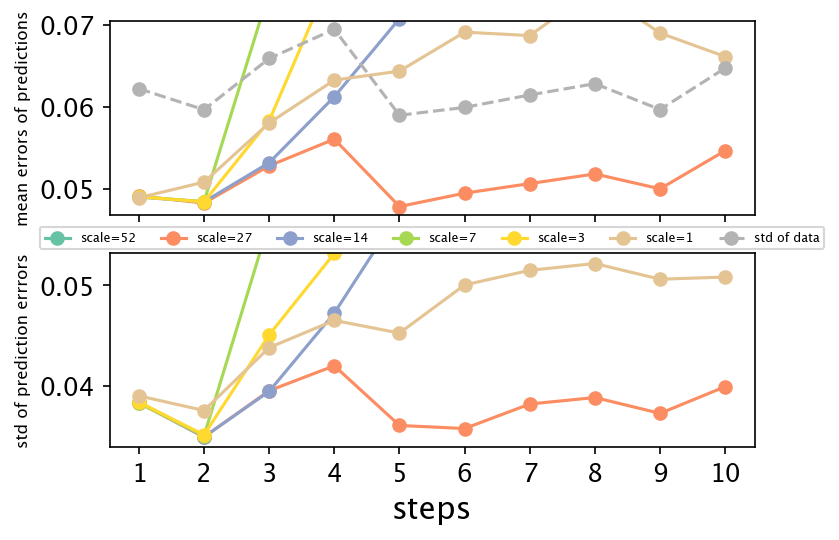

In [66]:
#
cmap=plt.get_cmap('Set2')
colors=cmap(np.linspace(0,1,7))

#
mean_52=np.mean(error_collection_52,(0,1))
#
mean_27=np.mean(error_collection_27,(0,1))
#
mean_14=np.mean(error_collection_14,(0,1))

#
mean_7=np.mean(error_collection_7,(0,1))
#
mean_3=np.mean(error_collection_3,(0,1))
#
mean_1=np.mean(error_collection_1,(0,1))

#
std=np.std(real,(0,1))
std_1=np.std(error_collection_1,(0,1))
std_3=np.std(error_collection_3,(0,1))
std_7=np.std(error_collection_7,(0,1))
std_14=np.std(error_collection_14,(0,1))
std_27=np.std(error_collection_27,(0,1))
std_52=np.std(error_collection_52,(0,1))

# Create a figure and axis object
fig, ax = plt.subplots(2, 1, figsize=(5, 4),dpi=150,sharex=True)

# Plot the data
ax[0].plot(mean_52,marker='o',c=colors[0],label='scale=52')
ax[0].plot(mean_27,marker='o',c=colors[1],label='scale=27')
ax[0].plot(mean_14,marker='o',c=colors[2],label='scale=14')
ax[0].plot(mean_7,marker='o',c=colors[3],label='scale=7')
ax[0].plot(mean_3,marker='o',c=colors[4],label='scale=3')
ax[0].plot(mean_1,marker='o',c=colors[5],label='scale=1')
ax[0].plot(std,marker='o',linestyle='--',c=colors[6],label='std of data')

ax[1].plot(std_52,marker='o',c=colors[0])
ax[1].plot(std_27,marker='o',c=colors[1])
ax[1].plot(std_14,marker='o',c=colors[2])
ax[1].plot(std_7,marker='o',c=colors[3])
ax[1].plot(std_3,marker='o',c=colors[4])
ax[1].plot(std_1,marker='o',c=colors[5])

'''
#
ax.fill_between(range(len(mean_27)), lower_bound_52, upper_bound_52, alpha=0.1,color=colors[5])
ax.fill_between(range(len(mean_27)), lower_bound_27, upper_bound_27, alpha=0.1,color=colors[1])
ax.fill_between(range(len(mean_27)), lower_bound_14, upper_bound_14, alpha=0.1,color=colors[2])
ax.fill_between(range(len(mean_27)), lower_bound_7, upper_bound_7, alpha=0.1,color=colors[3])
ax.fill_between(range(len(mean_27)), lower_bound_3, upper_bound_3, alpha=0.1,color=colors[4])
ax.fill_between(range(len(mean_27)), lower_bound_1, upper_bound_1, alpha=0.2,color=colors[0])
'''
# 添加刻度标签
ax[0].tick_params(labelsize=12)
ax[1].tick_params(labelsize=12)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)

ax[1].set_xticks(bar_positions)
ax[1].set_xticklabels(scale)

ax[0].set_ylabel('mean errors of predictions',fontsize=8)
ax[0].set_ylim([mean_27.min()-1e-3,std.max()+1e-3])

ax[1].set_xlabel('steps',fontsize=15)
ax[1].set_ylabel('std of prediction errrors',fontsize=8)
ax[1].set_ylim([std_27.min()-1e-3,std_1.max()+1e-3])
#plt.yscale('log')
handles, labels = ax[0].get_legend_handles_labels()
#ax[0].legend(['scale=52','scale=27','scale=14','scale=7','scale=3','scale=1','std of data'],loc='lower right',fontsize=6.5)
ax[1].legend(handles,labels,fontsize=6,loc='center',bbox_to_anchor=(0.5,1.08),ncols=7)

plt.show()

In [124]:
def errors_with_non_vis(model,level):
    predict_collection=[]
    for subject in tqdm(range(30)):
        data_sample=data[-subject-1,initial_time[subject]:initial_time[subject]+1,:]
        #
        #Set those indexes(which are not vis) to be 0
        data_sample[:,indexes==0]=0
        predict=multi_step_predict(data_sample,model,steps)
        predict_collection.append(predict)
        
    prediction_collection=[predict_collection[i].detach().numpy() for i in range(30)]
    prediction_collection=np.array(prediction_collection)
    #Know the real data
    real=[]
    for subject in range(30):
        real_sample=data[-subject-1,initial_time[subject]+1:initial_time[subject]+steps+1,:]
        real_sample[:,indexes==0]=0
        real.append(data[-subject-1,initial_time[subject]+1:initial_time[subject]+steps+1,:].detach().numpy().T)
    real=np.array(real)
    error=prediction_collection-real[:,np.newaxis,:,:]
    
    prediction_collection=prediction_collection[:,level,:,:]
    error_collection=np.abs(error[:,level,:,:])
    return real,prediction_collection,error_collection

In [125]:
real,prediction_collection_1,error_collection_1=errors_with_non_vis(net1,6)
real,prediction_collection_3,error_collection_3=errors_with_non_vis(net3,5)
real,prediction_collection_7,error_collection_7=errors_with_non_vis(net7,4)
real,prediction_collection_14,error_collection_14=errors_with_non_vis(net14,3)
real,prediction_collection_27,error_collection_27=errors_with_non_vis(net27,2)
real,prediction_collection_52,error_collection_52=errors_with_non_vis(net52,1)

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [05:08<00:00, 10.27s/it]


In [126]:
error_collection_52=error_collection_52[:,indexes!=0,:]
error_collection_27=error_collection_27[:,indexes!=0,:]
error_collection_14=error_collection_14[:,indexes!=0,:]
error_collection_7=error_collection_7[:,indexes!=0,:]
error_collection_3=error_collection_3[:,indexes!=0,:]
error_collection_1=error_collection_1[:,indexes!=0,:]
real=real[:,indexes!=0,:]

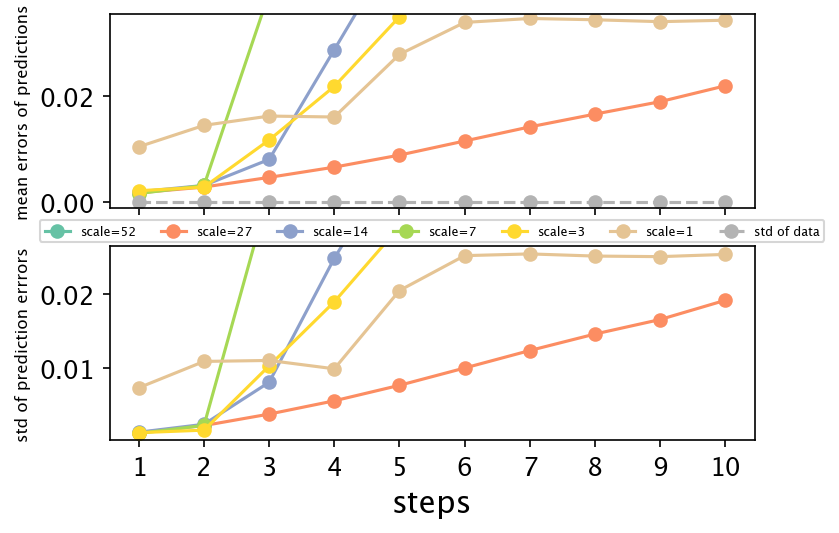

In [127]:
#
cmap=plt.get_cmap('Set2')
colors=cmap(np.linspace(0,1,7))

#
mean_52=np.mean(error_collection_52,(0,1))
#
mean_27=np.mean(error_collection_27,(0,1))
#
mean_14=np.mean(error_collection_14,(0,1))

#
mean_7=np.mean(error_collection_7,(0,1))
#
mean_3=np.mean(error_collection_3,(0,1))
#
mean_1=np.mean(error_collection_1,(0,1))

#
std=np.std(real,(0,1))
std_1=np.std(error_collection_1,(0,1))
std_3=np.std(error_collection_3,(0,1))
std_7=np.std(error_collection_7,(0,1))
std_14=np.std(error_collection_14,(0,1))
std_27=np.std(error_collection_27,(0,1))
std_52=np.std(error_collection_52,(0,1))

# Create a figure and axis object
fig, ax = plt.subplots(2, 1, figsize=(5, 4),dpi=150,sharex=True)

# Plot the data
ax[0].plot(mean_52,marker='o',c=colors[0],label='scale=52')
ax[0].plot(mean_27,marker='o',c=colors[1],label='scale=27')
ax[0].plot(mean_14,marker='o',c=colors[2],label='scale=14')
ax[0].plot(mean_7,marker='o',c=colors[3],label='scale=7')
ax[0].plot(mean_3,marker='o',c=colors[4],label='scale=3')
ax[0].plot(mean_1,marker='o',c=colors[5],label='scale=1')
ax[0].plot(std,marker='o',linestyle='--',c=colors[6],label='std of data')

ax[1].plot(std_52,marker='o',c=colors[0])
ax[1].plot(std_27,marker='o',c=colors[1])
ax[1].plot(std_14,marker='o',c=colors[2])
ax[1].plot(std_7,marker='o',c=colors[3])
ax[1].plot(std_3,marker='o',c=colors[4])
ax[1].plot(std_1,marker='o',c=colors[5])

'''
#
ax.fill_between(range(len(mean_27)), lower_bound_52, upper_bound_52, alpha=0.1,color=colors[5])
ax.fill_between(range(len(mean_27)), lower_bound_27, upper_bound_27, alpha=0.1,color=colors[1])
ax.fill_between(range(len(mean_27)), lower_bound_14, upper_bound_14, alpha=0.1,color=colors[2])
ax.fill_between(range(len(mean_27)), lower_bound_7, upper_bound_7, alpha=0.1,color=colors[3])
ax.fill_between(range(len(mean_27)), lower_bound_3, upper_bound_3, alpha=0.1,color=colors[4])
ax.fill_between(range(len(mean_27)), lower_bound_1, upper_bound_1, alpha=0.2,color=colors[0])
'''
# 添加刻度标签
ax[0].tick_params(labelsize=12)
ax[1].tick_params(labelsize=12)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)

ax[1].set_xticks(bar_positions)
ax[1].set_xticklabels(scale)

ax[0].set_ylabel('mean errors of predictions',fontsize=8)
#ax[0].set_ylim([mean_1.min()-1e-3,std.max()+1e-3])
ax[0].set_ylim([std.min()-1e-3,std_1.max()+1e-2])

ax[1].set_xlabel('steps',fontsize=15)
ax[1].set_ylabel('std of prediction errrors',fontsize=8)
ax[1].set_ylim([std_27.min()-1e-3,std_1.max()+1e-3])
#plt.yscale('log')
handles, labels = ax[0].get_legend_handles_labels()
#ax[0].legend(['scale=52','scale=27','scale=14','scale=7','scale=3','scale=1','std of data'],loc='lower right',fontsize=6.5)
ax[1].legend(handles,labels,fontsize=6,loc='center',bbox_to_anchor=(0.5,1.08),ncols=7)

plt.show()

In [22]:
#Load all possible values
net1 = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net1.load_state_dict(torch.load('AOMIC_preprocessed_Results/system//NIS+_schaefer_cut=1.9_hidden=256_layer=1_training=800/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))
#
net1_vis = Parellel_Renorm_Dynamic(sym_size = data.shape[2], latent_size = 1, effect_size = data.shape[2],
                         cut_size=1.9, hidden_units = 256, normalized_state = True,device=device)
net1_vis.load_state_dict(torch.load('AOMIC_preprocessed_Results/visual/NIS+_schaefer_cut=2_hidden=256_layer=1_cover=non_vis_training=800_normalize=True_reweight=True/AOMIC_preprocessed_schaefer_100_model_kde10000.pkl',map_location=torch.device('cpu')))

<All keys matched successfully>

In [23]:
def encoding_function_system_1(input_data):
    return net1.encoding(input_data)[-1]

def encoding_function_vis_1(input_data):
    return net1_vis.encoding(input_data)[-1]

In [24]:
indexes=[]
for label in labels:
    if b'Vis' in label:
        indexes.append(0)
    elif b'SomMot' in label:
        indexes.append(1)
    elif b'DorsAttn' in label:
        indexes.append(2)
    elif b'SalVentAttn' in label:
        indexes.append(3)
    elif b'Limbic' in label:
        indexes.append(4)
    elif b'Cont' in label:
        indexes.append(5)
    elif b'Default' in label:
        indexes.append(6)
indexes=np.array(indexes)

In [25]:
#Find out input and target
input=data[:,:-1,:]
target=data[:,1:,:]
#Where we check the integrated gradient
#the data where we check across people
input_mean=input.mean(0)
target_mean=target.mean(0)
#Choose a random time for analysis
time=np.arange(289)
baseline=torch.zeros([100])

In [26]:
input_mean.shape

torch.Size([289, 100])

In [27]:
input_mean[:,indexes!=0]=0

In [28]:
ig_vis = IntegratedGradients(encoding_function_vis_1)
attributions_vis,approximation_error = ig_vis.attribute(input_mean,method='gausslegendre',
                                                 return_convergence_delta=True)

In [29]:
atlas_map=nib.load(atlas_filename)

In [30]:
#100 regions
stat_img=np.zeros(atlas_map.get_fdata().shape)
cmap =mcolors.LinearSegmentedColormap.from_list("n_cmap", ['#F4F1DE', '#DF7A5E'])
attributions_normalize=attributions_vis.abs().mean(0)/attributions_vis.abs().mean(0).sum()
for i in range(100):
    stat_img[atlas_map.get_fdata()==i+1]=attributions_normalize[i]

In [31]:
stat_img=nib.Nifti1Image(stat_img,atlas_map.affine)

In [44]:
plotting.view_img_on_surf(stat_img,cmap=plt.cm.Reds,vmin=0,symmetric_cmap=False)

In [80]:
attributions_system=attributions

In [81]:
attributions_system_normalize=attributions_system.abs().mean(0)/attributions_system.abs().mean(0).sum()
attributions_vis_normalize=attributions_vis.abs().mean(0)/attributions_vis.abs().mean(0).sum()

In [82]:
#100 regions
stat_img=np.zeros(atlas_map.get_fdata().shape)
cmap =mcolors.LinearSegmentedColormap.from_list("n_cmap", ['#F4F1DE', '#DF7A5E'])
attributions=attributions_system_normalize-attributions_vis_normalize
attributions_normalize=attributions.abs()/attributions.abs().sum()
for i in range(100):
    stat_img[atlas_map.get_fdata()==i+1]=attributions_normalize[i]

In [83]:
stat_img=nib.Nifti1Image(stat_img,atlas_map.affine)

In [109]:
plotting.view_img_on_surf(stat_img,cmap=plt.cm.Reds,symmetric_cmap=False,threshold='99%')

In [33]:
bias_corrected_psi=np.array([-0.3601   -1.1535   -1.4263   -1.2062   -0.1917   -7.8240])

std_system =np.array([0.0655,0.1108,0.1785,0.2453,0.3586,0.5230])*1e-3

bias_corrected_psi_vis =np.array([0.002,-0.0367,-0.1412,0.4796,0,0])

std_vis =np.array([0.0245,0.0359,0.0610,0.0934,0,0])*1e-3


bias_corrected_psi_non_vis =np.array([ -0.3602,-1.1535,-1.4266,-1.2067,-0.1927,-7.8258])

std_non_vis =np.array([0.0515,0.0935,0.1459,0.2039,0.2945,0.4489])*1.0e-03

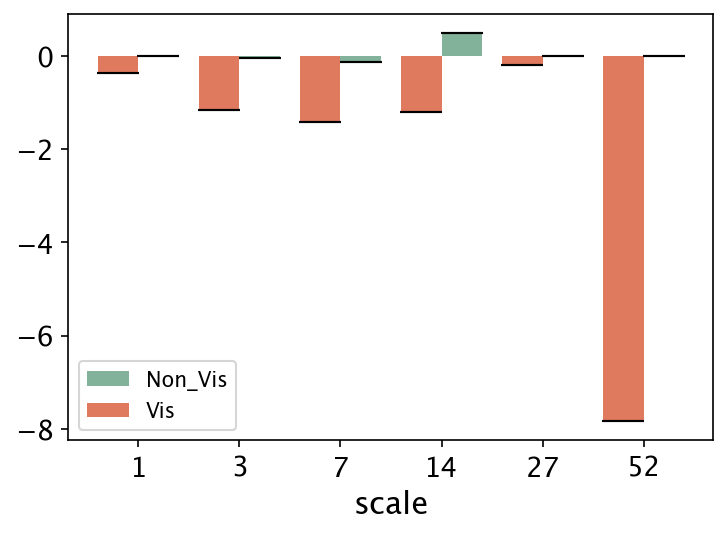

In [36]:
#scale=['52','27','14','7','3','1']
scale=['1','3','7','14','27','52']

# 创建柱状图
fig, ax = plt.subplots(1, 1, figsize=(5, 4),dpi=150)

# 设置柱状图的位置和宽度
bar_positions = np.arange(6)
bar_width = 0.4

# 使用seaborn库的color_palette函数设置配色
#colors = sns.color_palette('pastel', n_colors=2)

# 画柱状图，将颜色参数设置为colors
#bars = ax.bar(bar_positions-0.3, bias_corrected_psi, width=bar_width, color=colors[1], yerr=std_system , capsize=10)
bars = ax.bar(bar_positions+0.2,bias_corrected_psi_vis, width=bar_width, color=colors[3], yerr=std_vis, capsize=10)
bars = ax.bar(bar_positions-0.2,bias_corrected_psi_non_vis, width=bar_width, color=colors[1], yerr=std_non_vis,capsize=10)


# 添加坐标轴标签
#ax.set_xlabel('scale',size=14)
#ax.set_ylabel(r'$\mathcal{J}$',size=14)

# 添加刻度标签
plt.tick_params(labelsize=13)
plt.subplots_adjust(left=0.13, bottom=0.28, right=0.99, top=0.99,
                    wspace=0.25, hspace=0.2)

ax.set_xticks(bar_positions)
ax.set_xticklabels(scale)

plt.legend(['Non_Vis','Vis'])
plt.xlabel('scale',fontsize=15)
#plt.ylabel(r'$\Delta\mathcal{J}$', fontsize=15)


# 显示图形
plt.show()

In [116]:
'''
macro_data_1=np.zeros([data.shape[0]*data.shape[1],1])
for i in tqdm(range(data.shape[0])):
    sample_data=data[i,:,:]
    sample_data[:,indexes!=0]=0
    macro_data_1[i*data.shape[1]:(i+1)*data.shape[1],:]=net1_vis(sample_data)[1][-1][:,:].detach().numpy()
    
micro_data=data.reshape(-1,data.shape[2])

np.savetxt('ReconcilingEmergences/testdata/macro_data_vis_1.csv',macro_data_1)
'''

100%|██████████| 830/830 [14:38<00:00,  1.06s/it] 


In [2]:
import numpy as np
import entropy_estimators as ee

def EmergencePsi(X, V, tau=1, method=None):
    """
    Compute causal emergence criterion from data
    
    Args:
    - X: Micro time series data of shape (T, D)
    - V: Macro time series data of shape (T, R)
    - tau: Time delay (default: 1)
    - method: Estimation method for mutual information ('discrete' or 'gaussian') (default: None)
    
    Returns:
    - psi: Causal emergence criterion
    - v_mi: Mutual information in macro variables
    - x_mi: Mutual information in micro variables
    """
    
    # Parameter checks and initialisation
    if X.ndim != 2 or V.ndim != 2:
        raise ValueError("X and V have to be 2D matrices.")
    if X.shape[0] != V.shape[0]:
        raise ValueError("X and V must have the same height.")
    if tau is None:
        tau = 1
    if method is None:
        isdiscrete = np.isclose(X, np.round(X)).all() and np.isclose(V, np.round(V)).all()
        if isdiscrete:
            method = 'discrete'
        else:
            method = 'gaussian'
    
    if method.lower() == 'gaussian':
        MI_fun = ee.mi#GaussianMI
    elif method.lower() == 'discrete':
        MI_fun = ee.midd#DiscreteMI
    else:
        raise ValueError("Unknown method. Implemented options are 'gaussian' and 'discrete'.")
    
    # Compute mutual infos and psi
    v_mi = MI_fun(V[:-tau, :], V[tau:, :])
    x_mi = sum([MI_fun(np.array([X[:-tau, j]]).T, V[tau:, :]) for j in range(X.shape[1])])
    psi = v_mi - x_mi
    
    if len(X.shape) < 2:
        x_mi = None
    if len(V.shape) < 2:
        v_mi = None
    
    return psi, v_mi, x_mi

In [3]:
import numpy as np

# Read the 'mean_macro_data_1.csv' file
macro_data_1 = np.loadtxt('ReconcilingEmergences/testdata/mean_macro_data_1.csv')

# Read the 'mean_macro_data_3.csv' file
macro_data_3 = np.loadtxt('ReconcilingEmergences/testdata/mean_macro_data_3.csv')

# Read the 'mean_macro_data_7.csv' file
macro_data_7 = np.loadtxt('ReconcilingEmergences/testdata/mean_macro_data_7.csv')

# Read the 'mean_macro_data_14.csv' file
macro_data_14 = np.loadtxt('ReconcilingEmergences/testdata/mean_macro_data_14.csv')

# Read the 'mean_macro_data_27.csv' file
macro_data_27 = np.loadtxt('ReconcilingEmergences/testdata/mean_macro_data_27.csv')

# Read the 'mean_macro_data_52.csv' file
macro_data_52 = np.loadtxt('ReconcilingEmergences/testdata/mean_macro_data_52.csv')

# Read the 'mean_micro_data.csv' file
micro_data = np.loadtxt('ReconcilingEmergences/testdata/mean_micro_data.csv')

In [40]:
micro_data=micro_data[:,indexes==0]

In [41]:
psi_1, v_mi, x_mi=EmergencePsi(micro_data, macro_data_1[:,np.newaxis], tau=1)

In [42]:
psi_1

0.05854746695859925

In [43]:
psi_3, v_mi, x_mi=EmergencePsi(micro_data, macro_data_3, tau=1)

In [44]:
psi_3

-1.623563415800786

In [45]:
psi_7, v_mi, x_mi=EmergencePsi(micro_data, macro_data_7, tau=1)

In [46]:
psi_7

-4.530370114029264

In [47]:
psi_14, v_mi, x_mi=EmergencePsi(micro_data, macro_data_14, tau=1)

In [48]:
psi_14

-0.24893522068342078

In [49]:
psi_27, v_mi, x_mi=EmergencePsi(micro_data, macro_data_27, tau=1)

In [50]:
psi_27

1.786669392232633

In [51]:
psi_52, v_mi, x_mi=EmergencePsi(micro_data, macro_data_52, tau=1)

In [52]:
psi_52

1.1410316865545154

In [55]:
scale=['1','3','7','14','27','52']

<BarContainer object of 6 artists>

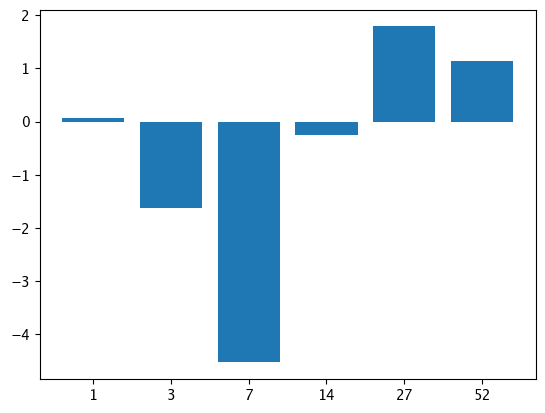

In [56]:
plt.bar(scale,height=[psi_1,psi_3,psi_7,psi_14,psi_27,psi_52])